# Project 2 of Evaluation Phase 2 -Temperature Forecast Project

### Project Description :
    This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.


##### Attribute Information:
For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T


You have to build separate models that can predict the minimum temperature for the next day and the maximum temperature for the next day based on the details provided in the dataset.

Dataset Link-
•	https://github.com/FlipRoboTechnologies/ML_-Datasets/blob/main/Temperature%20Forecast/temperature.csv


##### import the required library

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

###### read the dataset with pandas

In [2]:
data=pd.read_csv(r"C:\Users\Arcturus\Downloads\temperature.csv")
data

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


Checked the data type

In [3]:
data.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

###### here we see :
    only Date is object data type rest are float64 data types.

### Data intigrity check :

###### checked the null values

In [4]:
data.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [5]:
# show with the percentage
null_val = data.isnull().sum().sort_values(ascending = False)
per_null_val =(null_val/len(data))*100
print(pd.concat([null_val,per_null_val], axis =1, keys =['Missing Values', '% Missing data']))

                  Missing Values  % Missing data
LDAPS_CC3                     75        0.967492
LDAPS_PPT4                    75        0.967492
LDAPS_PPT2                    75        0.967492
LDAPS_PPT1                    75        0.967492
LDAPS_CC4                     75        0.967492
LDAPS_CC2                     75        0.967492
LDAPS_CC1                     75        0.967492
LDAPS_LH                      75        0.967492
LDAPS_WS                      75        0.967492
LDAPS_Tmin_lapse              75        0.967492
LDAPS_Tmax_lapse              75        0.967492
LDAPS_RHmax                   75        0.967492
LDAPS_RHmin                   75        0.967492
LDAPS_PPT3                    75        0.967492
Present_Tmin                  70        0.902993
Present_Tmax                  70        0.902993
Next_Tmax                     27        0.348297
Next_Tmin                     27        0.348297
Date                           2        0.025800
station             

here we see some less than 1% data in almost column have null values.

In [6]:
# remove the missing values with row wise
df=data.dropna(axis=0)

In [7]:
df.shape

(7588, 25)

###### Check the values counts

In [8]:
for col in df:
    print(df[col].value_counts())
    print("="*35)

station
25.0    307
10.0    307
23.0    307
18.0    307
17.0    307
2.0     307
3.0     306
4.0     306
13.0    305
16.0    304
20.0    304
21.0    304
14.0    303
1.0     303
9.0     302
12.0    302
15.0    302
19.0    302
22.0    302
24.0    302
11.0    301
7.0     301
6.0     301
8.0     300
5.0     296
Name: count, dtype: int64
Date
30-06-2013    25
23-07-2016    25
22-08-2015    25
23-08-2015    25
24-08-2015    25
              ..
13-08-2015    22
24-07-2015    22
06-07-2017    22
23-08-2017    22
30-06-2017    16
Name: count, Length: 307, dtype: int64
Present_Tmax
31.4    112
29.4    108
29.1    106
29.2    105
30.6    105
       ... 
21.2      1
20.1      1
36.4      1
20.3      1
20.0      1
Name: count, Length: 167, dtype: int64
Present_Tmin
24.0    160
23.8    153
23.5    143
23.1    143
23.3    140
       ... 
14.3      1
29.9      1
29.7      1
29.1      1
15.0      1
Name: count, Length: 155, dtype: int64
LDAPS_RHmin
77.030350    2
51.810596    2
71.658089    2
58.255688 

here we see all column is numeric and Next_Tmax or Next_Tmin is also a continuous fearture and this is target variable so we can say that its a regressor problem.

##### Check the duplicate value

In [9]:
df.duplicated().sum()

0

there is no any duplicate value present in data.

###### Checked the white spaces

In [10]:
df.isin([' ','NA','-']).sum().any()

False

No white spaces present in data.

In [11]:
#Date column is a object type .i have to convert in datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Date split the year month or date and drop the Date and year column .
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,2013,6,30
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,2013,6,30
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,2013,6,30
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,2013,6,30
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,2013,6,30


Now to gain more insight in data, we will create additional columns with location of station in terms of city and respective state.

In [12]:
# Importing Reverse geocoder
# !pip install reverse_geocoder
import reverse_geocoder as rg
import pprint

In [13]:
geodata=[]
def reverse_geocoordinates(coordinates):
    result = rg.search(coordinates)
    return (result)

if __name__=="__main__":
    coordinates = list(zip(df['lat'], df['lon']))
    data = reverse_geocoordinates(coordinates)
    geodata.append(data)
# Creating dataframe for geographical name
geo_names = pd.DataFrame(geodata).transpose()

Loading formatted geocoded file...


###### We have gather state and city name as per corresponding to it's latitude and longitude available. Now it is time incorporate state and city columns in our dataset.

In [14]:
df['State']= geo_names[0].apply(lambda x:x.get('admin1'))
df['City']=geo_names[0].apply(lambda x:x.get('name'))

In [15]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day,State,City
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,212.3350,2.7850,5992.895996,29.1,21.2,2013,6,30,Seoul,Seoul
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,44.7624,0.5141,5869.312500,30.5,22.5,2013,6,30,Seoul,Seoul
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,33.3068,0.2661,5863.555664,31.1,23.9,2013,6,30,Seoul,Seoul
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,45.7160,2.5348,5856.964844,31.7,24.3,2013,6,30,Seoul,Seoul
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,35.0380,0.5055,5859.552246,31.2,22.5,2013,6,30,Gyeonggi-do,Guri-si


##### Statistics Analysis

In [16]:
# Describe the data
df.describe()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day
count,7588.000000,7588,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,...,7588.000000,7588.00000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,13.014101,2015-07-27 18:22:12.208750592,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,...,37.544792,126.99142,61.918136,1.259755,5343.724208,30.241526,22.910820,2014.991697,7.465999,15.939510
min,1.000000,2013-06-30 00:00:00,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,37.456200,126.82600,12.370000,0.098500,4329.520508,17.400000,11.300000,2013.000000,6.000000,1.000000
25%,7.000000,2014-07-15 00:00:00,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,...,37.510200,126.93700,28.700000,0.271300,5001.485717,28.200000,21.300000,2014.000000,7.000000,8.000000
50%,13.000000,2015-07-29 00:00:00,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,...,37.550700,126.99500,45.716000,0.618000,5441.987305,30.400000,23.100000,2015.000000,7.000000,16.000000
75%,19.000000,2016-08-14 00:00:00,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,...,37.577600,127.04200,59.832400,1.767800,5729.485840,32.600000,24.600000,2016.000000,8.000000,24.000000
max,25.000000,2017-08-30 00:00:00,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,37.645000,127.13500,212.335000,5.178200,5992.895996,38.900000,29.800000,2017.000000,8.000000,31.000000
std,7.217858,NaN,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,...,0.050428,0.07922,54.323529,1.372748,429.782561,3.111807,2.482256,1.410877,0.528635,8.906521


In [17]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
station,7588.0,13.014101,1.0,7.0,13.0,19.0,25.0,7.217858
Date,7588,2015-07-27 18:22:12.208750592,2013-06-30 00:00:00,2014-07-15 00:00:00,2015-07-29 00:00:00,2016-08-14 00:00:00,2017-08-30 00:00:00,NaN
Present_Tmax,7588.0,29.748366,20.0,27.8,29.9,32.0,37.6,2.967401
Present_Tmin,7588.0,23.195809,11.3,21.6,23.4,24.8,29.9,2.40088
LDAPS_RHmin,7588.0,56.724969,19.794666,45.960243,55.023199,67.115099,98.524734,14.626559
LDAPS_RHmax,7588.0,88.360823,58.936283,84.203724,89.784122,93.742725,100.000153,7.199456
LDAPS_Tmax_lapse,7588.0,29.620128,17.624954,27.673756,29.709537,31.711109,38.542255,2.943496
LDAPS_Tmin_lapse,7588.0,23.511786,14.272646,22.08682,23.758249,25.15566,29.619342,2.342579
LDAPS_WS,7588.0,7.094097,2.88258,5.675358,6.547838,8.02896,21.857621,2.177034
LDAPS_LH,7588.0,62.492606,-13.603212,37.206201,56.898324,84.235666,213.414006,33.686158


###### Comment : 
    all count same so there is no any missing value.
    almost column has mean equal to median(50%).so we can say almost in normal distribution curve.
    no huge difference b/w 75% and max values.

### EDA And Visualization

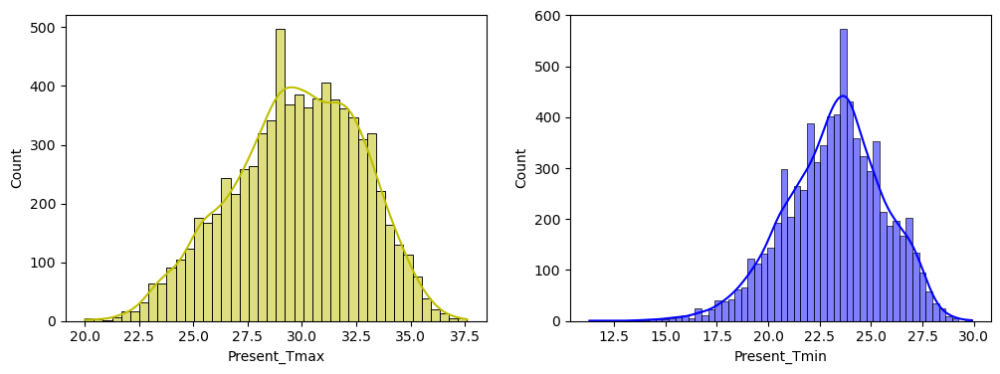

In [18]:
# Plotting histogram for present_Tmax and present_Tmin variables
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
sns.histplot(df['Present_Tmax'],kde=True,color='y')
plt.subplot(1,2,2)
sns.histplot(df['Present_Tmin'],kde=True,color='b')
plt.show()

###### Comment:
    For majority of reading Present Temperature Maximum varies in between 27.5 to 32.5 degree.
    For majority of reading Present Temperature Minimum varies in between 22.5 to 26 degree.

###### Line Plot of Present Temperature Maximum over each Station

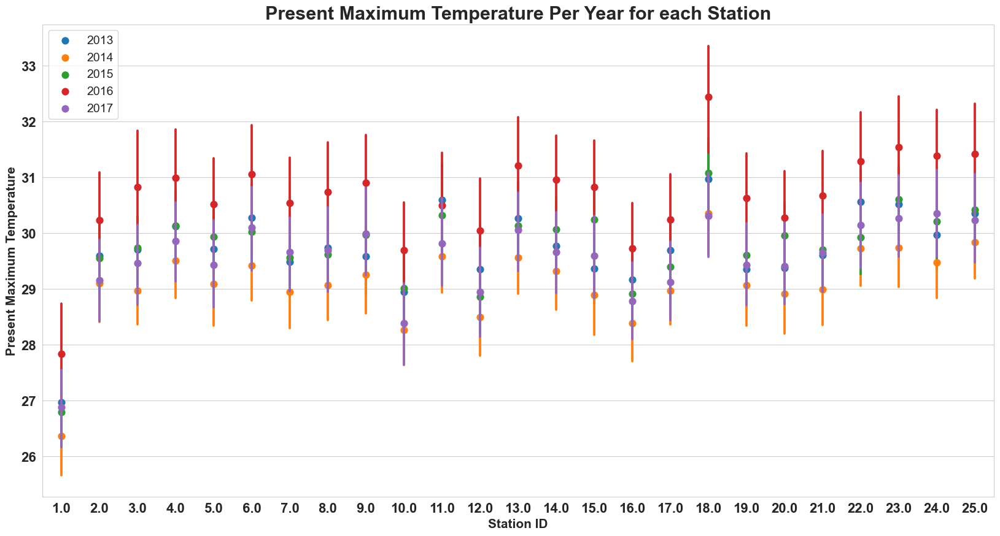

In [19]:
plt.figure(figsize=(20,10))
sns.set_style('whitegrid')
sns.pointplot(x='station', y='Present_Tmax', data=df, hue='Year',join=False)
plt.title('Present Maximum Temperature Per Year for each Station', fontsize=22, fontweight='bold')
plt.xlabel('Station ID',{'fontsize':15,'fontweight' :'bold'})
plt.ylabel('Present Maximum Temperature',{'fontsize':15,'fontweight' :'bold'})
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.legend(fontsize=14)

##### Observation on line plot of Present Maximum Temperature:
    Over all four year higher temperature recorded at station 18 in compare to rest.
    Station 1 is coolest station over all timeframe.
    We can see 2016 is hottest year and 2014 is coolest year. It will be interesting to explore these two year independently.
    Year 2017 is much cooler compare to Year 2016. Precious relife to people in 2017 !!!

##### Line Plot of Present Temperature Minimum over each Station

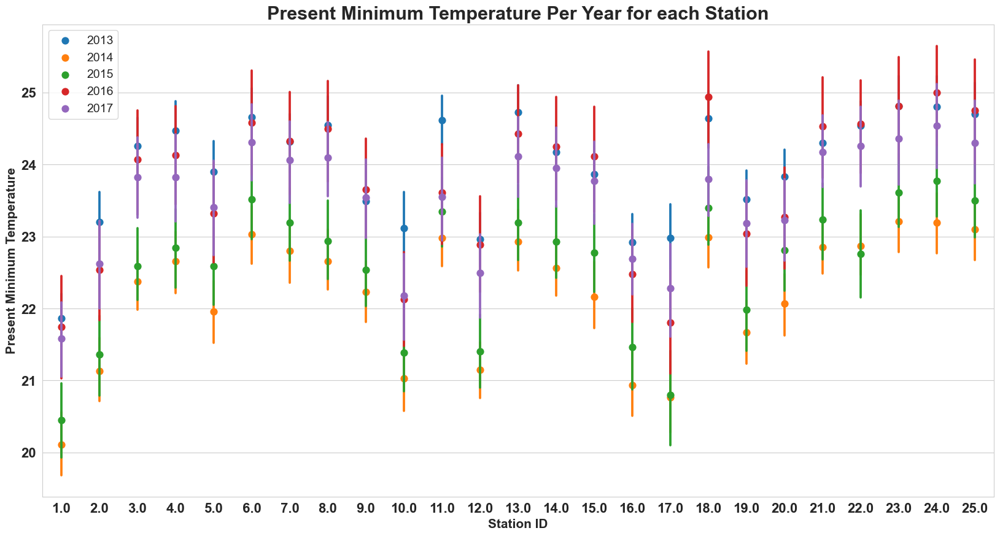

In [20]:
plt.figure(figsize=(20,10))
sns.set_style('whitegrid')
sns.pointplot(x='station', y='Present_Tmin', data=df, hue='Year',join=False)
plt.title('Present Minimum Temperature Per Year for each Station', fontsize=22, fontweight='bold')
plt.xlabel('Station ID',{'fontsize':15,'fontweight' :'bold'})
plt.ylabel('Present Minimum Temperature',{'fontsize':15,'fontweight' :'bold'})
plt.xticks(fontsize=16,fontweight ='bold')
plt.yticks(fontsize=16,fontweight ='bold')
plt.legend(fontsize=14)

###### Observation on line plot of Present Minimum Temperature:
Year 2014 is coolest year of all time frame.
Highest Present Minimum Temperature recorded at Station 24 inspite of Not having Highest Present Maximum Temperature. This is implies that over day period minimum temperature drop recorded at station 24.
Station 1 is coolest station of all time followed by station 17. Must be tourist spot in Summer.

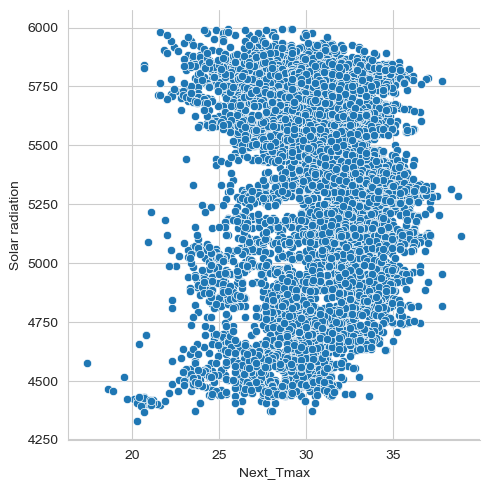

In [21]:
# relation b/w Next_Tmax and Solar radiation
sns.relplot(x=df['Next_Tmax'], y=df['Solar radiation'])

<Axes: xlabel='Month', ylabel='Solar radiation'>

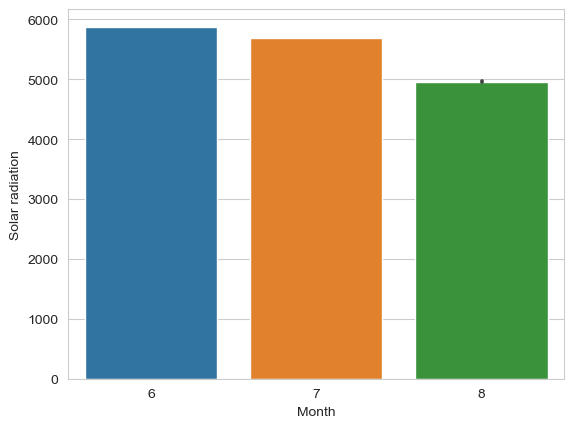

In [22]:
sns.barplot(x=df['Month'], y=df['Solar radiation'])

###### relation b/w both target variable

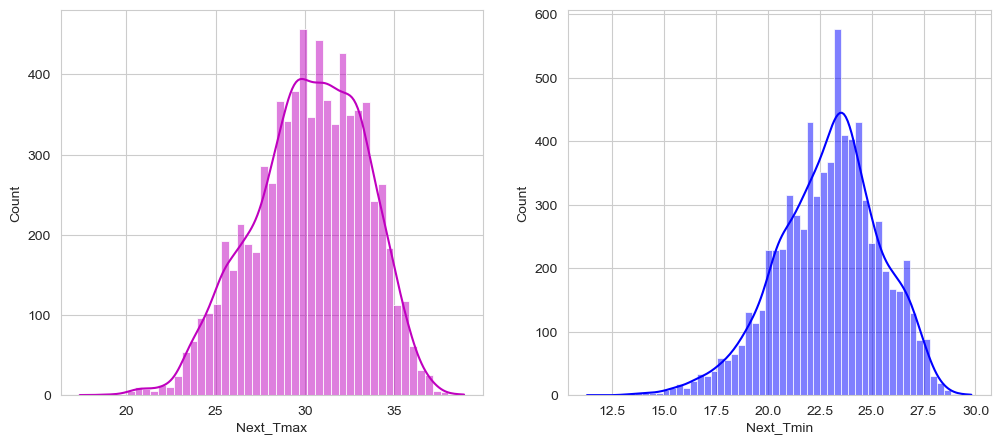

In [23]:
# Plotting histogram for target variables
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.histplot(df['Next_Tmax'],kde=True,color='m')
plt.subplot(1,2,2)
sns.histplot(df['Next_Tmin'],kde=True,color='b')
plt.show()

###### We get same result as we get in case of present temperature.

    For majority of reading Next Temperature Maximum varies in between 27.5 to 32.5 degree.
    For majority of reading Next Temperature Minimum varies in between 22.5 to 26 degree.

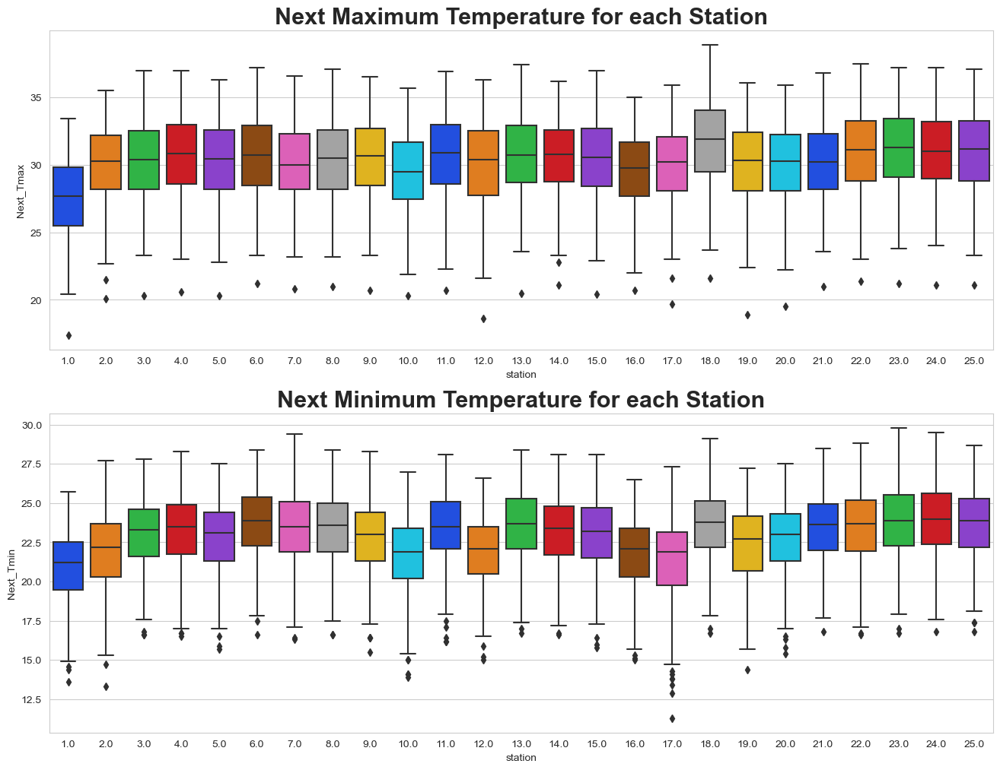

In [24]:
# Visualizing the realtion between station and target variables
plt.figure(figsize=(16,12))
plt.subplot(2,1,1)
sns.boxplot(x=df['station'],y=df['Next_Tmax'],data=df,palette="bright")
plt.title('Next Maximum Temperature for each Station', fontsize=22, fontweight='bold')
plt.subplot(2,1,2)
sns.boxplot(x=df['station'],y=df['Next_Tmin'],data=df,palette="bright")
plt.title('Next Minimum Temperature for each Station', fontsize=22, fontweight='bold')
plt.show()

###### we see :
    we can notice the station 18 has highest temperature collection for both Next_Tmax and Next_Tmin targets.
    Maximum temperature difference at same station occur in station 17.

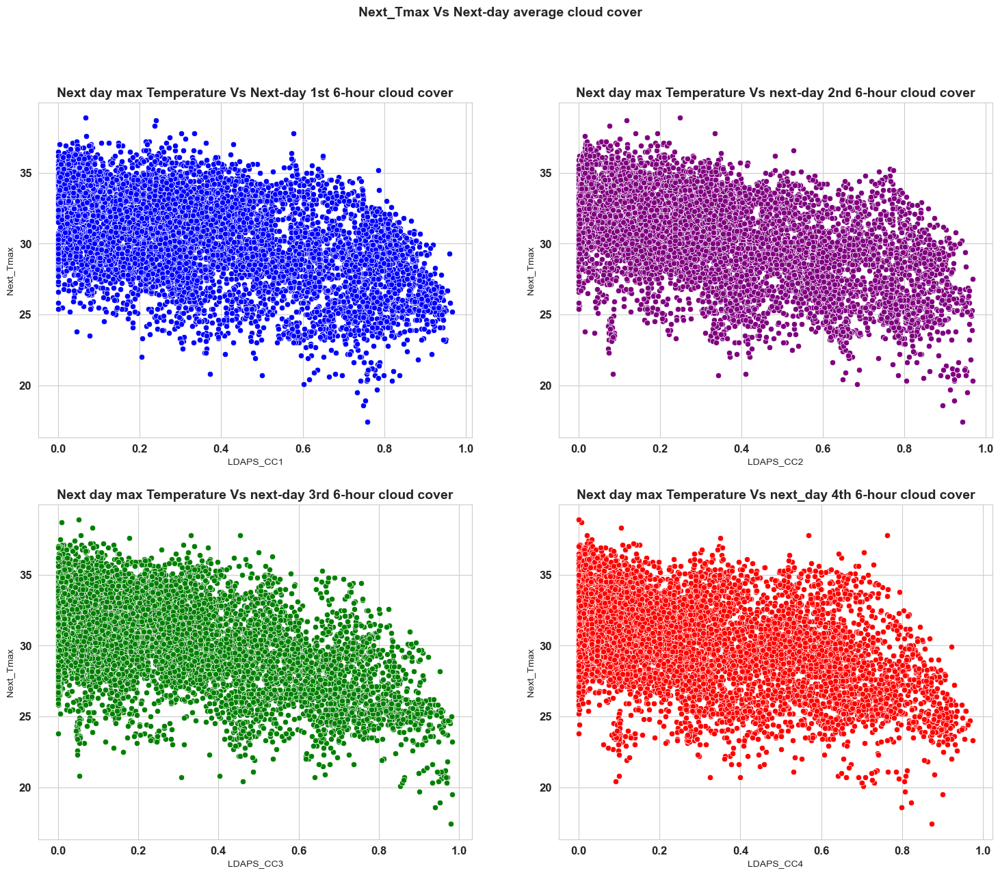

In [25]:
# Comparing Next day maximnum temperature and next day average cloud cover

plt.figure(figsize=(18,14))
plt.suptitle('Next_Tmax Vs Next-day average cloud cover',fontsize=14, fontweight='bold')

plt.subplot(2,2,1)
plt.title('Next day max Temperature Vs Next-day 1st 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC1',y='Next_Tmax',data=df,color="blue")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,2)
plt.title('Next day max Temperature Vs next-day 2nd 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC2',y='Next_Tmax',data=df,color='purple')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,3)
plt.title('Next day max Temperature Vs next-day 3rd 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC3',y='Next_Tmax',data=df,color='green')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,4)
plt.title('Next day max Temperature Vs next_day 4th 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC4',y='Next_Tmax',data=df,color="red")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.show()

Irrespective of 6 hr quarter in 24 hr day time, Next-day Temperature Maximum decreases as cloud cover increases beyond 0.6.

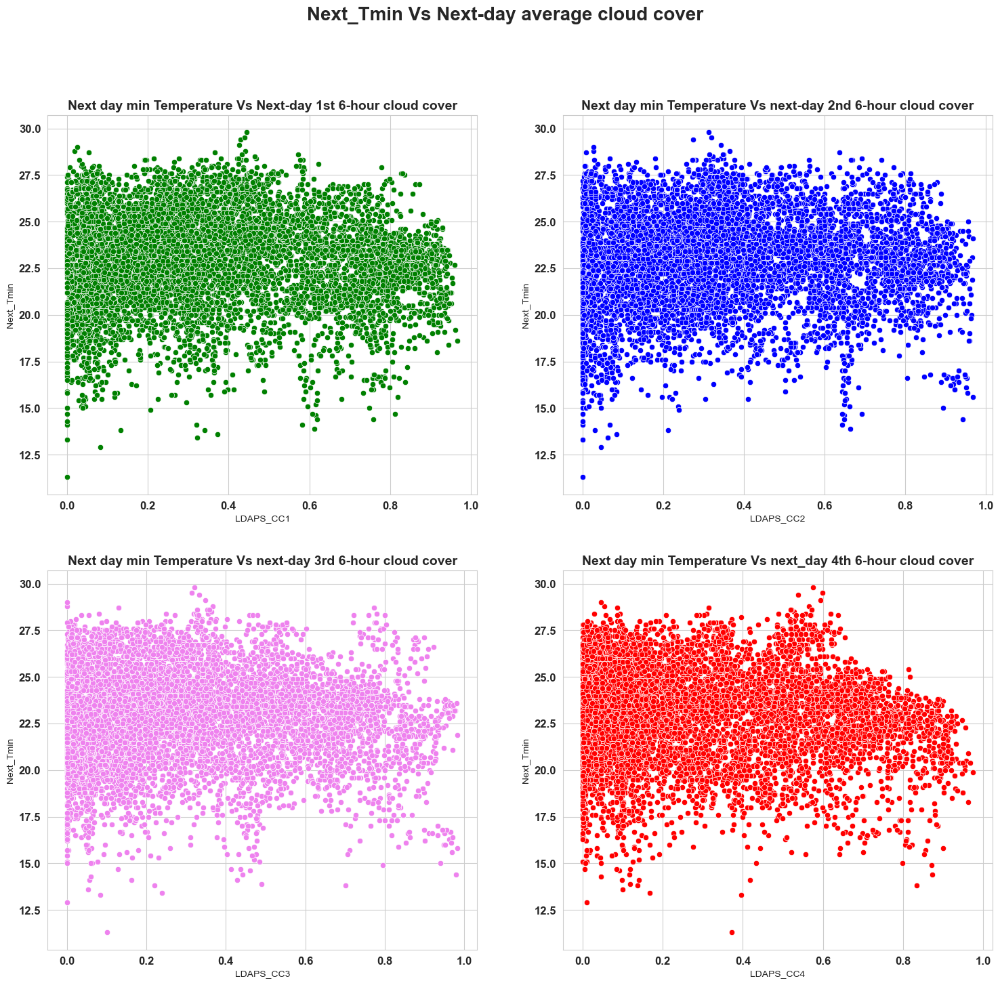

In [26]:

# Comparing Next day minimum temperature and next day average cloud cover

plt.figure(figsize=(18,16))
plt.suptitle('Next_Tmin Vs Next-day average cloud cover',fontsize=20, fontweight='bold')

plt.subplot(2,2,1)
plt.title('Next day min Temperature Vs Next-day 1st 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC1',y='Next_Tmin',data=df,color="g")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,2)
plt.title('Next day min Temperature Vs next-day 2nd 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC2',y='Next_Tmin',data=df,color='b')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,3)
plt.title('Next day min Temperature Vs next-day 3rd 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC3',y='Next_Tmin',data=df,color='violet')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,4)
plt.title('Next day min Temperature Vs next_day 4th 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC4',y='Next_Tmin',data=df,color="r")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.show()

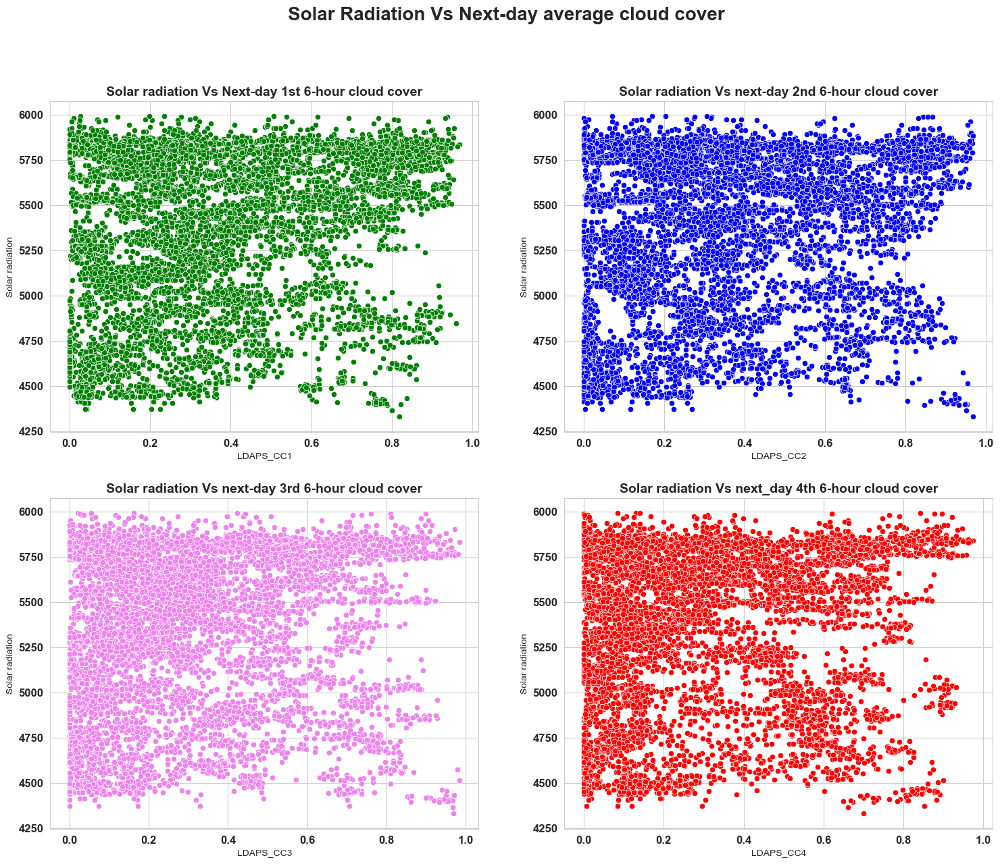

In [27]:
# Comparing Next day minimum temperature and next day average cloud cover

plt.figure(figsize=(18,14))
plt.suptitle('Solar Radiation Vs Next-day average cloud cover',fontsize=20, fontweight='bold')

plt.subplot(2,2,1)
plt.title('Solar radiation Vs Next-day 1st 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC1',y='Solar radiation',data=df,color="g")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,2)
plt.title('Solar radiation Vs next-day 2nd 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC2',y='Solar radiation',data=df,color='b')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,3)
plt.title('Solar radiation Vs next-day 3rd 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC3',y='Solar radiation',data=df,color='violet')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,4)
plt.title('Solar radiation Vs next_day 4th 6-hour cloud cover',fontsize=14, fontweight='bold')
sns.scatterplot(x='LDAPS_CC4',y='Solar radiation',data=df,color="r")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.show()

We can definitely say that for cloud cover greater than 0.7 high value solar radiation contributed most.

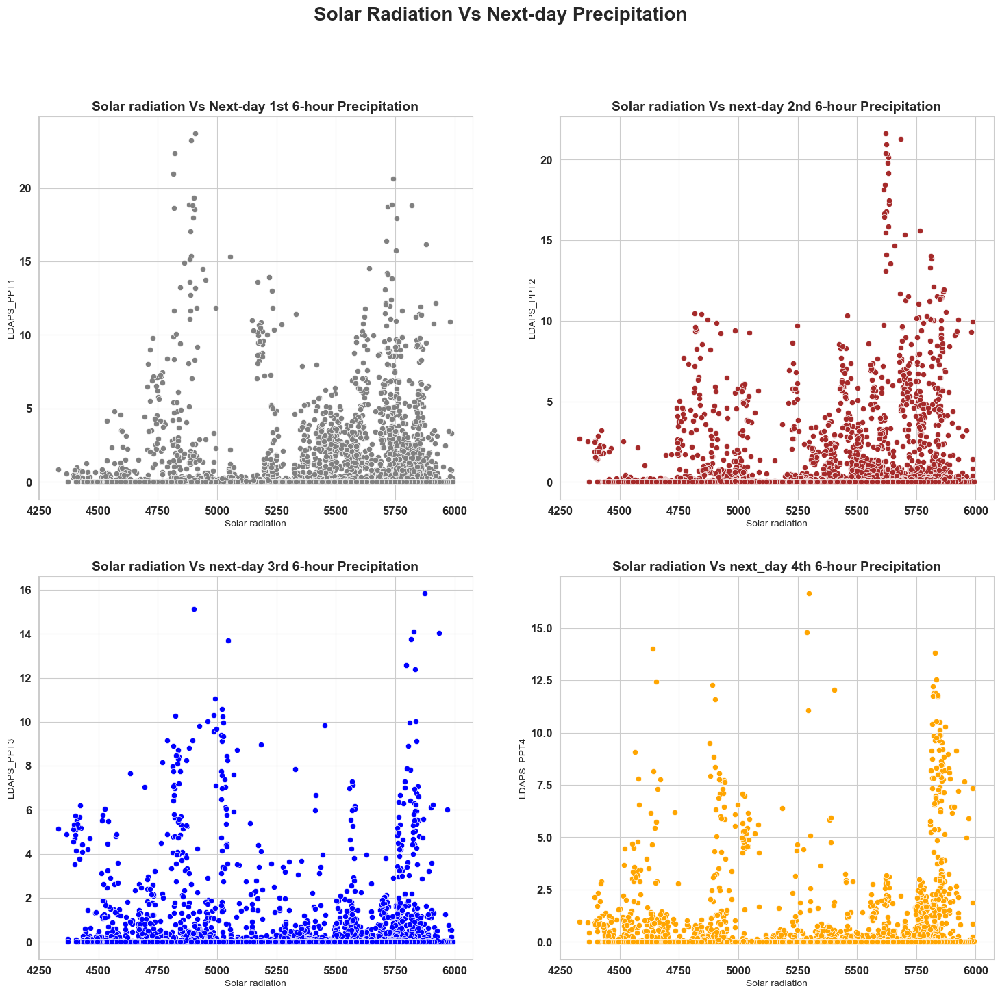

In [28]:
# Comparing Next day minimum temperature and next day average cloud cover

plt.figure(figsize=(18,16))
plt.suptitle('Solar Radiation Vs Next-day Precipitation',fontsize=20, fontweight='bold')

plt.subplot(2,2,1)
plt.title('Solar radiation Vs Next-day 1st 6-hour Precipitation',fontsize=14, fontweight='bold')
sns.scatterplot(y='LDAPS_PPT1',x='Solar radiation',data=df,color="grey")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,2)
plt.title('Solar radiation Vs next-day 2nd 6-hour Precipitation',fontsize=14, fontweight='bold')
sns.scatterplot(y='LDAPS_PPT2',x='Solar radiation',data=df,color='brown')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,3)
plt.title('Solar radiation Vs next-day 3rd 6-hour Precipitation',fontsize=14, fontweight='bold')
sns.scatterplot(y='LDAPS_PPT3',x='Solar radiation',data=df,color='blue')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,4)
plt.title('Solar radiation Vs next_day 4th 6-hour Precipitation',fontsize=14, fontweight='bold')
sns.scatterplot(y='LDAPS_PPT4',x='Solar radiation',data=df,color="orange")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.show()

###### Observation:
    Irrespective of to which 6 hr quarter reading belong, solar radiation value greater than 5500w/m2 leads to higher amount of precipitation (normally greater than 8).
    if we consider scatterplot of solar radiation vs cloud cover along with above scatter plot, we can draw inference that for higher value of solar radiation cloud cover and precipitation followed each other. In other words higher precipitation means higher cloud cover.


###### This all give rise to few questions here :
    Where relative humidity and wind speed fit in this equation of precipitation?
    Latent heat means heat absorption at constant temperature, there has to some effect of latent heat flux variation on relative humidity.
    Another interesting thing to look forward is wind tend to blow clound. What is wind speed value in relative terms when cloud cover is high?
    What is variation in precipitation,cloud cover and wind speed over year period?
    Variation of temperature over duration of one year period?

<Axes: xlabel='Month', ylabel='LDAPS_PPT1'>

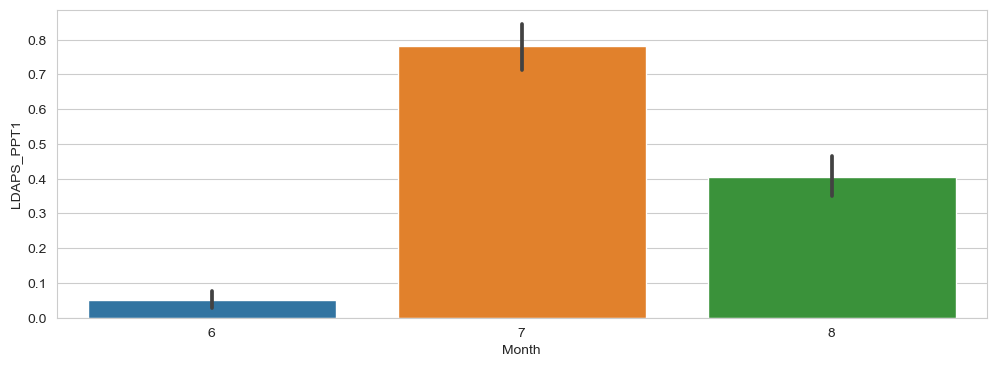

In [29]:
plt.figure(figsize=(12,4))
sns.barplot(x=df['Month'], y=df['LDAPS_PPT1'])

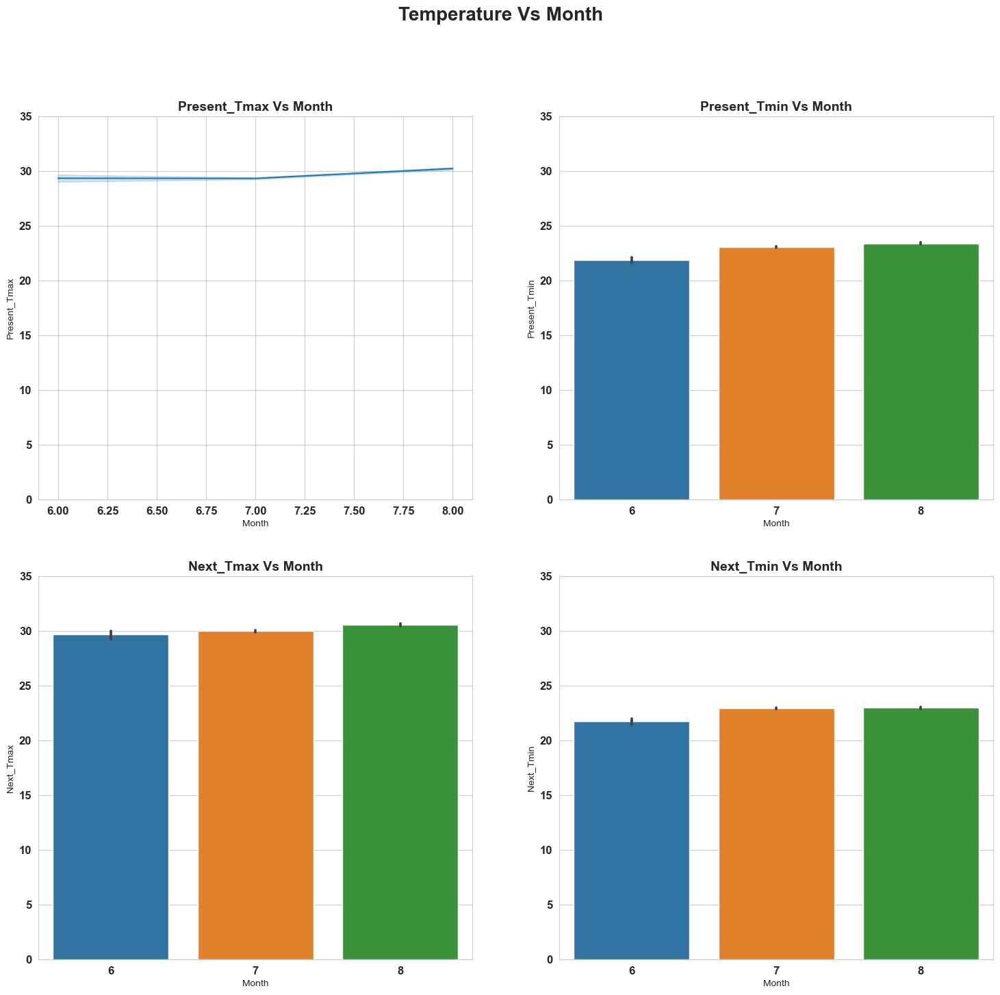

In [30]:
# Comparing Next day minimum temperature and next day average cloud cover

plt.figure(figsize=(18,16))
plt.suptitle('Temperature Vs Month',fontsize=20, fontweight='bold')

plt.subplot(2,2,1)
plt.title('Present_Tmax Vs Month',fontsize=14, fontweight='bold')
axes=sns.lineplot(y='Present_Tmax',x='Month',data=df)
axes.set_ylim([0, 35])
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,2)
plt.title('Present_Tmin Vs Month',fontsize=14, fontweight='bold')
axes=sns.barplot(y='Present_Tmin',x='Month',data=df)
axes.set_ylim([0, 35])
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,3)
plt.title('Next_Tmax Vs Month',fontsize=14, fontweight='bold')
axes=sns.barplot(y='Next_Tmax',x='Month',data=df)
axes.set_ylim([0, 35])
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,4)
plt.title('Next_Tmin Vs Month',fontsize=14, fontweight='bold')
axes=sns.barplot(y='Next_Tmin',x='Month',data=df)
axes.set_ylim([0, 35])
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.show()

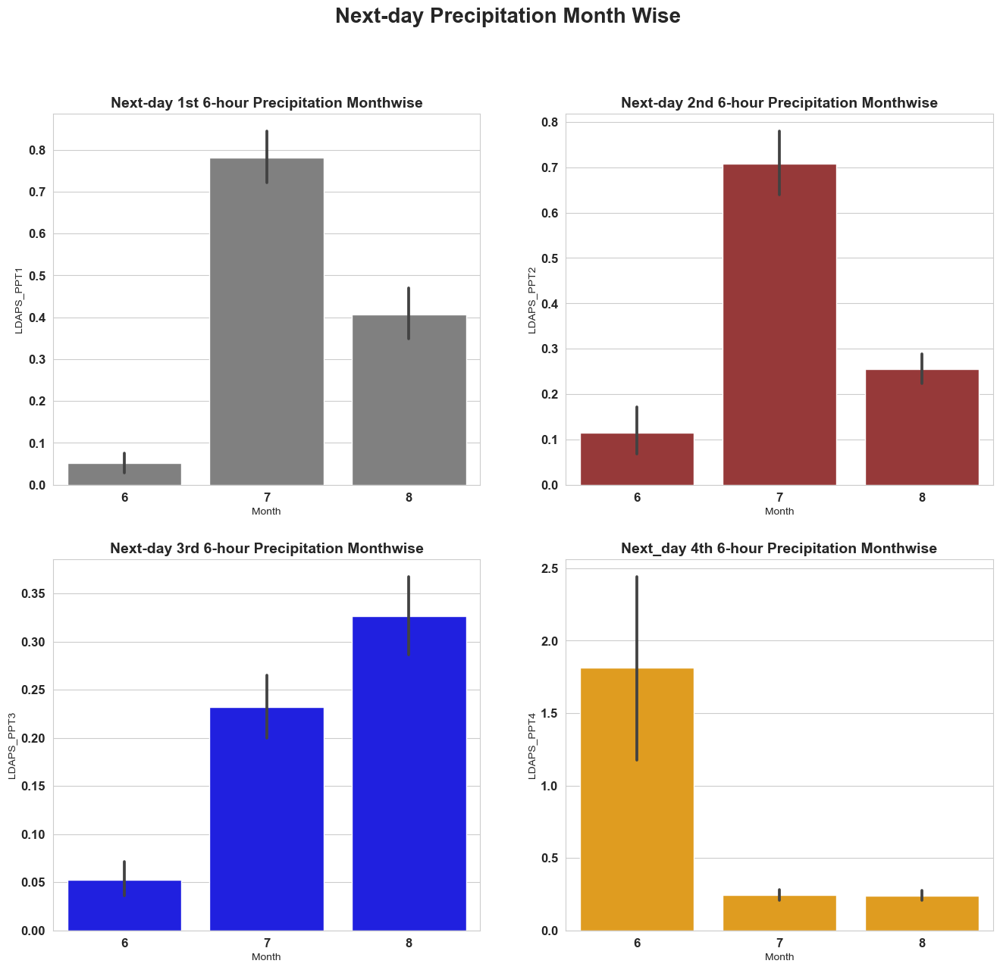

In [31]:

# Comparing Next day minimum temperature and next day average cloud cover

plt.figure(figsize=(16,14))
plt.suptitle('Next-day Precipitation Month Wise',fontsize=20, fontweight='bold')

plt.subplot(2,2,1)
plt.title('Next-day 1st 6-hour Precipitation Monthwise',fontsize=14, fontweight='bold')
sns.barplot(x=df['Month'], y=df['LDAPS_PPT1'],data=df,color="grey")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,2)
plt.title('Next-day 2nd 6-hour Precipitation Monthwise',fontsize=14, fontweight='bold')
sns.barplot(x=df['Month'], y=df['LDAPS_PPT2'],data=df,color='brown')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,3)
plt.title('Next-day 3rd 6-hour Precipitation Monthwise',fontsize=14, fontweight='bold')
sns.barplot(x=df['Month'], y=df['LDAPS_PPT3'],data=df,color='blue')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')

plt.subplot(2,2,4)
plt.title('Next_day 4th 6-hour Precipitation Monthwise',fontsize=14, fontweight='bold')
sns.barplot(x=df['Month'], y=df['LDAPS_PPT4'],data=df,color="orange")
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.show()

Minimum Solar radiation : 4329.520508
Maximum Solar radiation : 5992.895996
Average Solar radiation : 5343.724207856747


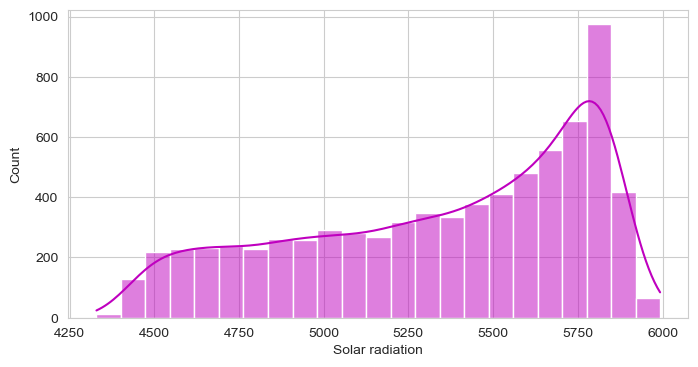

In [32]:
plt.figure(figsize=(8,4))
sns.histplot(df['Solar radiation'],kde=True,color='m')
print('Minimum Solar radiation :',df['Solar radiation'].min())
print('Maximum Solar radiation :',df['Solar radiation'].max())
print('Average Solar radiation :',df['Solar radiation'].mean())

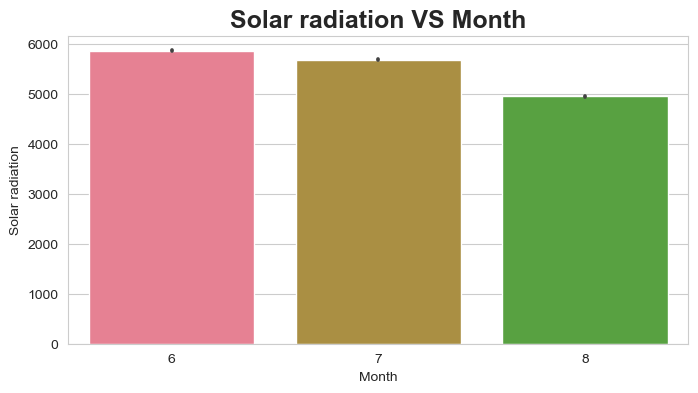

In [33]:
sns.set_palette('husl')
plt.figure(figsize=(8,4))
sns.barplot(y=df['Solar radiation'], x=df['Month'])
plt.title('Solar radiation VS Month',fontsize=18, fontweight='bold')
plt.show()

Minimum Wind Speed : 2.882579625 m/s
Maximum Wind Speed : 21.85762099 m/s
Average Wind Speed : 7.0940966991598575 m/s


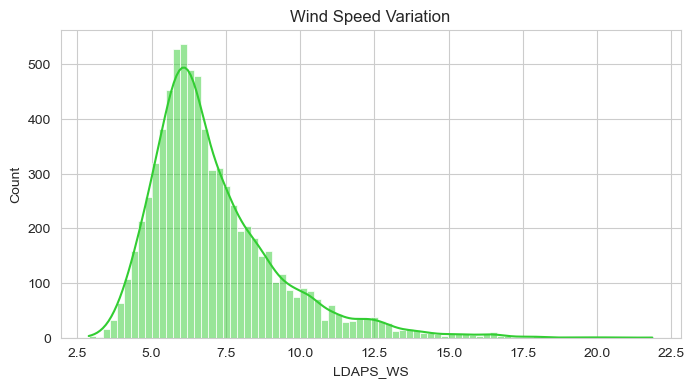

In [34]:
plt.figure(figsize=(8,4))
sns.histplot(df['LDAPS_WS'],kde=True,color='limegreen')
plt.title('Wind Speed Variation')
print('Minimum Wind Speed :',df['LDAPS_WS'].min(),'m/s')
print('Maximum Wind Speed :',df['LDAPS_WS'].max(),'m/s')
print('Average Wind Speed :',df['LDAPS_WS'].mean(),'m/s')

###### Comment :
    It have its minimum value at 2.88m/s and maximum values at 21.85m/s
    For most of reading values lies in the rabge 5m/s to 8m/s
    Graph is slightly right skewed

Minimum RHmax is 58.93628311 % and Maximum RHmax is 100.0001526 %
Minimum RHmin is 19.79466629 % and Maximum RHmin is 98.5247345 %


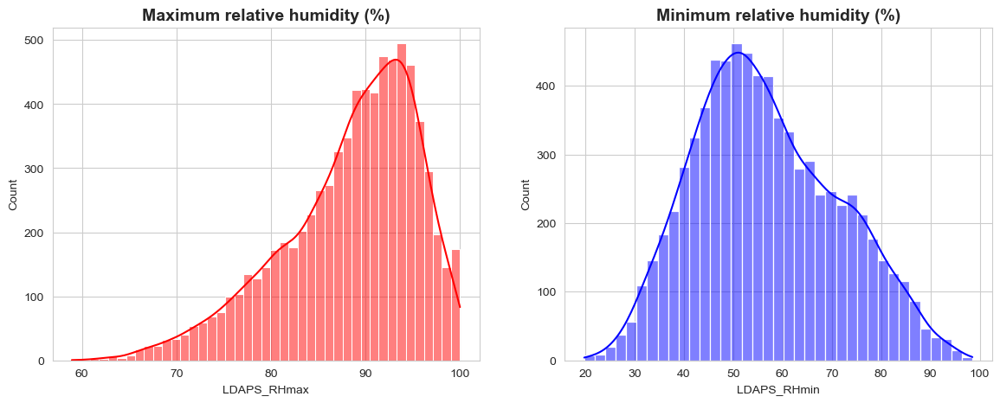

In [35]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
sns.histplot(df['LDAPS_RHmax'],kde=True,color='r')
plt.title('Maximum relative humidity (%)',fontsize=14, fontweight='bold')
plt.subplot(1,2,2)
sns.histplot(df['LDAPS_RHmin'],kde=True,color='b')
plt.title('Minimum relative humidity (%)',fontsize=14, fontweight='bold')
print('Minimum RHmax is {} % and Maximum RHmax is {} %'.format(df['LDAPS_RHmax'].min(),df['LDAPS_RHmax'].max()))
print('Minimum RHmin is {} % and Maximum RHmin is {} %'.format(df['LDAPS_RHmin'].min(),df['LDAPS_RHmin'].max()))

###### Comment :
    Data of Maximum Relative humidity is left skewed and Data of Minimum Relative humidity is slightly right skewed.
    Maximum Relative humidity for most of the days lie in the range 90 to 97
    Maximum Relative humidity lies in the range 45 to 62.

Minimum Tmax applied lapse rate is 17.62495378 (Â°C) and Maximum Tmax applied lapse rate is 38.54225522 (Â°C)
Minimum Tmin is applied lapse rate 14.27264631 (Â°C) and Maximum Tmin applied lapse rate is 29.61934244 (Â°C)


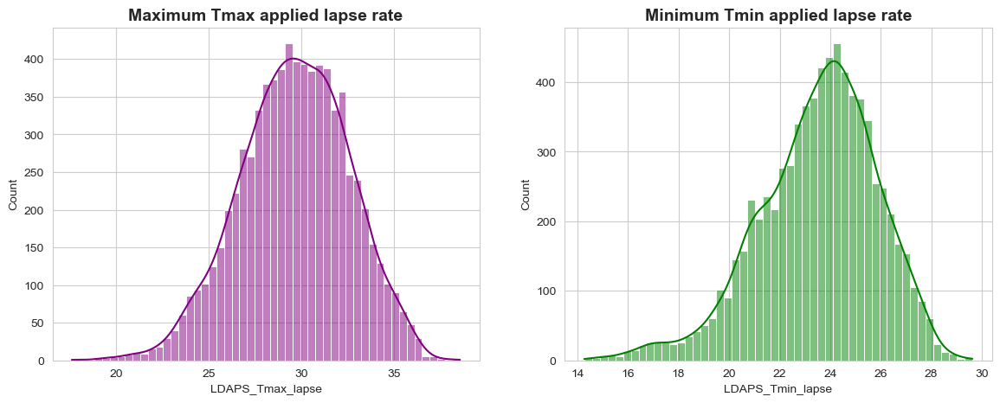

In [36]:
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
sns.histplot(df['LDAPS_Tmax_lapse'],kde=True,color='purple')
plt.title('Maximum Tmax applied lapse rate',fontsize=14, fontweight='bold')
plt.subplot(1,2,2)
sns.histplot(df['LDAPS_Tmin_lapse'],kde=True,color='green')
plt.title('Minimum Tmin applied lapse rate',fontsize=14, fontweight='bold')
print('Minimum Tmax applied lapse rate is {} (Â°C) and Maximum Tmax applied lapse rate is {} (Â°C)'.format(df['LDAPS_Tmax_lapse'].min(),df['LDAPS_Tmax_lapse'].max()))
print('Minimum Tmin is applied lapse rate {} (Â°C) and Maximum Tmin applied lapse rate is {} (Â°C)'.format(df['LDAPS_Tmin_lapse'].min(),df['LDAPS_Tmin_lapse'].max()))

    Tmax and Tmin for applied lapse rate are almost normally distributed.
    Tmax_lapse for majority of days its values lies in the range 27 to 33 (Â°C).
    Tmin_lapse for majority of days its values lies in the range 23 to 26 (Â°C).

Minimum Latent Heat Flux : -13.60321209
Maximum Latent Heat Flux : 213.4140062
Average Latent Heat Flux : 62.492606287988


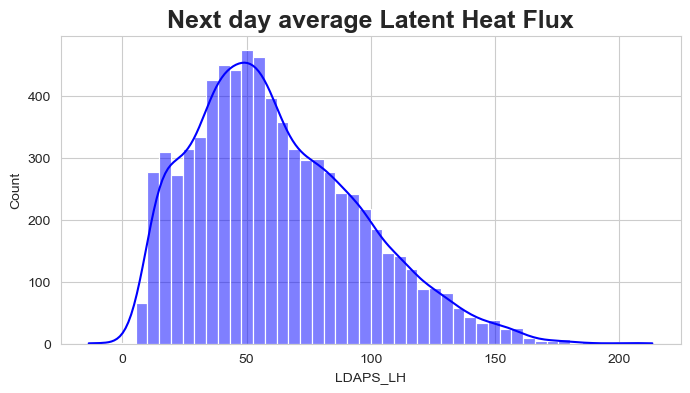

In [37]:
plt.figure(figsize=(8,4))
sns.histplot(df['LDAPS_LH'],kde=True,color='blue')
plt.title('Next day average Latent Heat Flux',fontsize=18, fontweight='bold')
print('Minimum Latent Heat Flux :',df['LDAPS_LH'].min())
print('Maximum Latent Heat Flux :',df['LDAPS_LH'].max())
print('Average Latent Heat Flux :',df['LDAPS_LH'].mean())

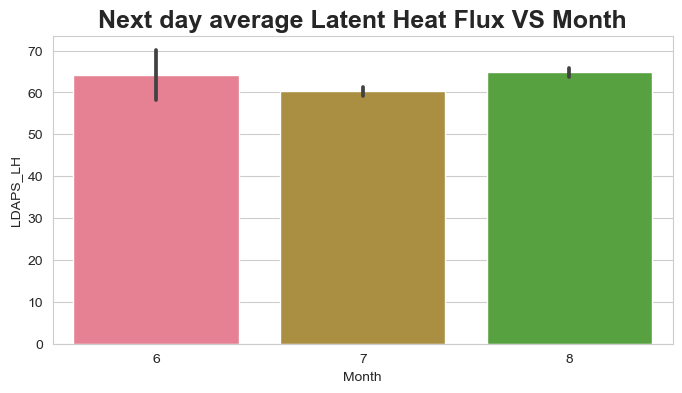

In [38]:
plt.figure(figsize=(8,4))
sns.barplot(y=df['LDAPS_LH'], x=df['Month'])
plt.title('Next day average Latent Heat Flux VS Month',fontsize=18, fontweight='bold')
plt.show()

###### Encoded the categorical data

In [39]:
#  Using Label Encoder on target variable
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in df.columns:
    if df[col].dtype=='object':
        df[col]=le.fit_transform(df[col])

###### Check the distribution of data

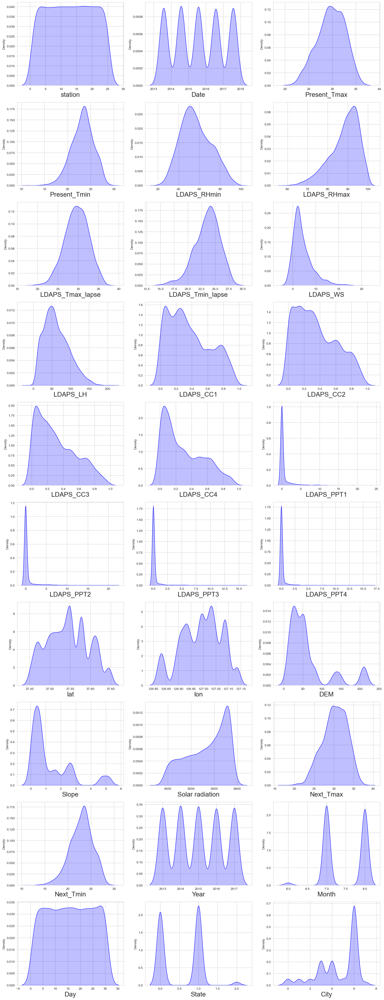

In [40]:
plt.figure(figsize=(20,60), facecolor='white')
col_no =1
for col in df:
    if col_no <= 33:
        ax = plt.subplot(11,3,col_no)
        sns.kdeplot(df[col], color='b',shade=True)
        plt.xlabel(col,fontsize=20)
    col_no +=1
plt.show()

In [41]:
# here drop the Date column
df.drop(['Date'],axis=1,inplace=True)

###### Show the outliers with boxplot

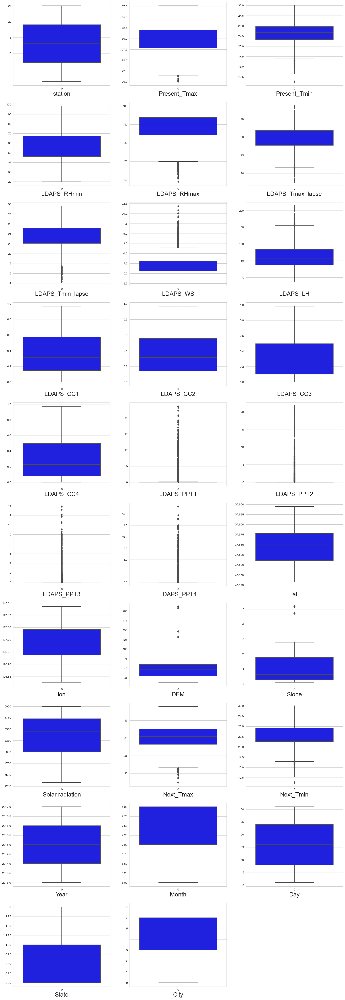

In [42]:
plt.figure(figsize=(20,60), facecolor='white')
col_no =1
for col in df:
    if col_no <=30:
        ax = plt.subplot(10,3,col_no)
        sns.boxplot(df[col], color='b')
        plt.xlabel(col,fontsize=20)
    col_no +=1
plt.show()

we see some column have outliers in dataset.

###### Remove the outliers with zscore

In [43]:
from scipy.stats import zscore
z = np.abs(zscore(df))
threshold = 3
df1 = df[(z<3).all(axis = 1)]

print ("Shape of the dataframe before removing outliers: ", df.shape)
print ("Shape of the dataframe after removing outliers: ", df1.shape)
print ("Percentage of data loss post outlier removal: ", (df.shape[0]-df1.shape[0])/df.shape[0]*100)

Shape of the dataframe before removing outliers:  (7588, 29)
Shape of the dataframe after removing outliers:  (6739, 29)
Percentage of data loss post outlier removal:  11.188719030047443


###### check the skewness

In [44]:
df1.skew()

station            -0.001594
Present_Tmax       -0.269936
Present_Tmin       -0.221250
LDAPS_RHmin         0.309567
LDAPS_RHmax        -0.686083
LDAPS_Tmax_lapse   -0.110563
LDAPS_Tmin_lapse   -0.379269
LDAPS_WS            1.085685
LDAPS_LH            0.567050
LDAPS_CC1           0.594835
LDAPS_CC2           0.505774
LDAPS_CC3           0.701288
LDAPS_CC4           0.708754
LDAPS_PPT1          3.724580
LDAPS_PPT2          4.854967
LDAPS_PPT3          5.516862
LDAPS_PPT4          5.924324
lat                 0.106983
lon                -0.277547
DEM                 1.764698
Slope               1.590130
Solar radiation    -0.520157
Next_Tmax          -0.267526
Next_Tmin          -0.234328
Year                0.025066
Month              -0.168571
Day                 0.000057
State               0.143188
City               -0.951530
dtype: float64

here we see data contain some positive or negative skewness.

In [45]:
# skew range b/w less than or equal to +0.5 and -0.5 for better prediction using yeo-johnson method
skew=['LDAPS_RHmax','LDAPS_WS','LDAPS_LH','LDAPS_CC3','LDAPS_CC4',
      'LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','DEM','Slope','Solar radiation']

# Importing Powertransformer
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

# Transfroming skew data
df1[skew] = scaler.fit_transform(df1[skew].values)

###### Check the correlation

In [46]:
df1.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Year,Month,Day,State,City
station,1.000000,0.110291,0.133638,-0.069582,-0.182354,0.066863,0.104401,0.030231,-0.135717,0.008671,...,-0.326019,-0.146034,-0.034787,0.106378,0.129110,0.006658,0.011380,0.005032,-0.107709,-0.172313
Present_Tmax,0.110291,1.000000,0.610428,-0.154266,-0.320074,0.540680,0.616886,-0.071596,0.119022,-0.290078,...,-0.130892,-0.092409,-0.099696,0.586943,0.615950,0.099185,0.169326,-0.130708,-0.049572,-0.028619
Present_Tmin,0.133638,0.610428,1.000000,0.151385,-0.053421,0.441577,0.764258,0.034364,-0.008556,0.090828,...,-0.238916,-0.157839,-0.047145,0.438813,0.785946,0.099222,0.106547,-0.082712,-0.073556,-0.032508
LDAPS_RHmin,-0.069582,-0.154266,0.151385,1.000000,0.566069,-0.555583,0.129481,0.171684,-0.002412,0.574389,...,0.057460,0.083910,0.229070,-0.433872,0.134518,0.001709,-0.179437,-0.073118,-0.078498,-0.060087
LDAPS_RHmax,-0.182354,-0.320074,-0.053421,0.566069,1.000000,-0.403634,-0.163219,0.060965,0.285942,0.425827,...,0.174176,0.209222,0.154031,-0.323446,-0.110402,-0.146019,-0.131920,-0.014136,-0.039266,-0.037656
LDAPS_Tmax_lapse,0.066863,0.540680,0.441577,-0.555583,-0.403634,1.000000,0.621299,-0.154400,0.005878,-0.416255,...,-0.110286,-0.105094,-0.034699,0.816861,0.553227,0.066794,0.116760,-0.139339,-0.033596,-0.001619
LDAPS_Tmin_lapse,0.104401,0.616886,0.764258,0.129481,-0.163219,0.621299,1.000000,-0.011333,-0.141554,0.037375,...,-0.169881,-0.156322,0.031865,0.546479,0.875382,0.050935,0.062899,-0.141725,-0.074432,-0.029104
LDAPS_WS,0.030231,-0.071596,0.034364,0.171684,0.060965,-0.154400,-0.011333,1.000000,-0.056362,0.203057,...,0.113157,0.095385,0.164626,-0.205979,0.023330,-0.119526,-0.128725,-0.058922,-0.004350,-0.016754
LDAPS_LH,-0.135717,0.119022,-0.008556,-0.002412,0.285942,0.005878,-0.141554,-0.056362,1.000000,-0.113430,...,0.053275,0.069892,-0.032027,0.151784,-0.052365,0.054981,0.046641,-0.021563,-0.042471,-0.038202
LDAPS_CC1,0.008671,-0.290078,0.090828,0.574389,0.425827,-0.416255,0.037375,0.203057,-0.113430,1.000000,...,-0.030080,-0.032476,0.235623,-0.453763,0.008400,-0.069276,-0.222037,-0.046380,-0.037880,-0.025990


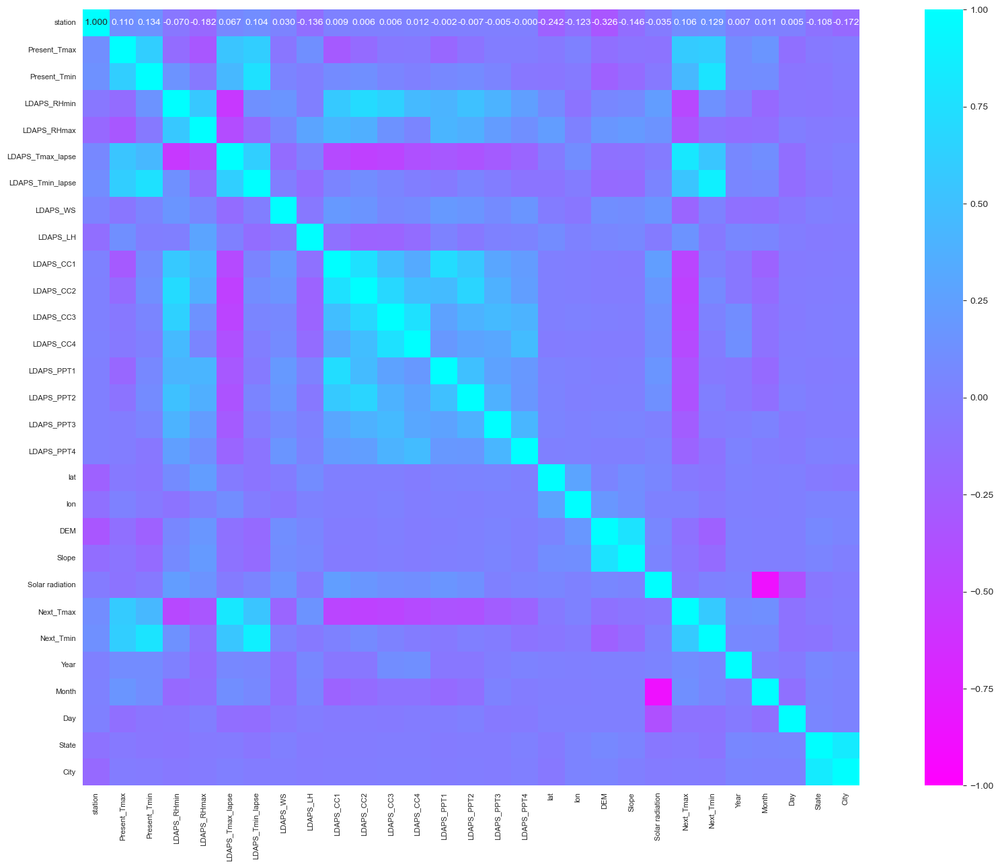

In [47]:
# Lets Visualize the correlation with heatmap
plt.figure(figsize=(25,15))
sns.heatmap(df1.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':10}, cmap="cool_r")
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

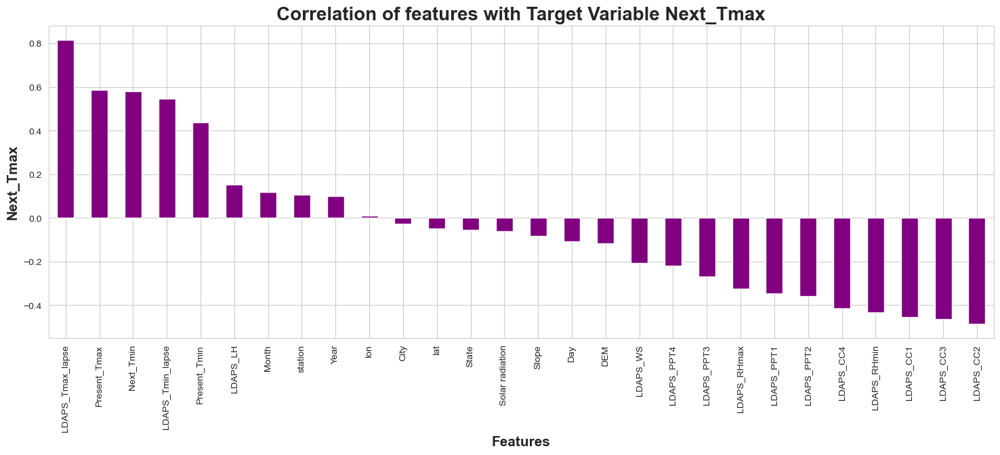

In [48]:
plt.figure(figsize = (18,6))
df1.corr()['Next_Tmax'].drop(['Next_Tmax']).sort_values(ascending=False).plot(kind='bar',color = 'purple')
plt.xlabel('Features',fontsize=15,fontweight='bold')
plt.ylabel('Next_Tmax',fontsize=15,fontweight='bold')
plt.title('Correlation of features with Target Variable Next_Tmax',fontsize = 20,fontweight='bold')
plt.show()

Temperature and cloud cover related feature are moderately or highly correlated with Target Feature.

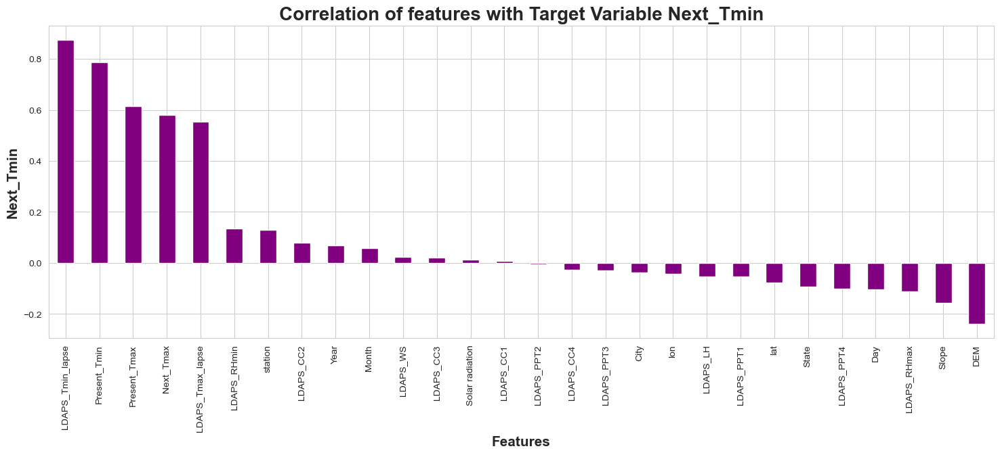

In [49]:
plt.figure(figsize = (18,6))
df1.corr()['Next_Tmin'].drop(['Next_Tmin']).sort_values(ascending=False).plot(kind='bar',color = 'purple')
plt.xlabel('Features',fontsize=15,fontweight='bold')
plt.ylabel('Next_Tmin',fontsize=15,fontweight='bold')
plt.title('Correlation of features with Target Variable Next_Tmin',fontsize = 20,fontweight='bold')
plt.show()

Temperature related feature are moderately or highly correlated with Target Feature.

# Machine Learning Model Building For Next_Tmax

#### Separate feature and label

In [50]:
X=df1.drop(['Next_Tmax'],axis=1)

In [51]:
Y=df1['Next_Tmax']

In [52]:
print(f'Shape of X data : {X.shape}')
print(f'Shape of Y data : {Y.shape}')

Shape of X data : (6739, 28)
Shape of Y data : (6739,)


### Using StandardScalar

In [53]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X=pd.DataFrame(sc.fit_transform(X),columns=X.columns)
X

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lon,DEM,Slope,Solar radiation,Next_Tmin,Year,Month,Day,State,City
0,-1.672719,-0.425704,-0.814460,0.195915,0.348222,-0.662498,-0.289928,0.176871,0.349992,-0.440130,...,0.002925,1.854393,1.327776,1.891687,-0.790587,-1.421473,-2.806491,1.589342,0.868781,0.790184
1,-1.533959,0.690215,-0.727785,-0.236604,0.261118,-0.016693,0.171379,-0.574617,-0.166810,-0.473686,...,0.518733,0.069704,-0.375858,1.431077,-0.239151,-1.421473,-2.806491,1.589342,0.868781,0.790184
2,-1.395198,0.585598,0.008945,-0.494494,-0.717348,0.070769,0.409475,-0.252083,-1.378337,-0.537958,...,0.845830,-0.353433,-0.944115,1.410511,0.354704,-1.421473,-2.806491,1.589342,0.868781,0.790184
3,-1.256438,0.725088,0.052282,0.194767,1.375094,-0.069787,-0.146681,-0.606795,0.245926,-0.510012,...,0.392926,0.098766,1.249133,1.387059,0.524376,-1.421473,-2.806491,1.589342,0.868781,0.790184
4,-1.117678,0.515853,-0.597774,0.045667,0.186035,-0.284509,-0.074752,-0.541825,1.298111,-0.768323,...,1.814542,-0.278815,-0.392364,1.396254,-0.239151,-1.421473,-2.806491,1.589342,-1.025949,-0.893893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6734,1.102482,-2.378563,-2.374595,-2.226900,-1.363447,-0.757521,-2.400625,0.048293,-2.013062,-1.159992,...,0.619378,-0.712912,-0.269357,-1.763704,-2.275223,1.442938,1.002379,1.589342,2.763511,1.351543
6735,1.241243,-2.587798,-2.547943,-1.836710,-0.753410,-1.160213,-2.620034,-0.516916,0.685720,-1.106080,...,1.198089,-0.999559,-1.353609,-1.781247,-2.529732,1.442938,1.002379,1.589342,2.763511,1.351543
6736,1.380003,-2.308818,-2.677955,-2.078766,-1.302260,-1.288468,-2.188536,-0.244791,0.421213,-1.250919,...,-1.255142,-1.576584,-1.278502,-1.779394,-2.105550,1.442938,1.002379,1.589342,2.763511,1.351543
6737,1.518763,-2.308818,-2.417932,-2.273699,-1.457152,-1.049238,-2.207453,0.011101,-0.319269,-1.227700,...,-1.028689,-1.397502,-1.069018,-1.785446,-1.808623,1.442938,1.002379,1.589342,2.763511,1.351543


#### Checking Multicollinearity between features using variance_inflation_factor

In [54]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(X.values,i) for i in range(len(X.columns))]
vif["Features"]=X.columns
vif

,VIF values,Features
0,1.369867,station
1,2.925818,Present_Tmax
2,3.411735,Present_Tmin
3,6.185258,LDAPS_RHmin
4,2.590695,LDAPS_RHmax
5,6.961344,LDAPS_Tmax_lapse
6,8.658372,LDAPS_Tmin_lapse
7,1.233636,LDAPS_WS
8,1.517961,LDAPS_LH
9,4.868161,LDAPS_CC1


here Solar radiation,Month,Day has a highly VIF values so this is highly Multicollinearity.

In [55]:
# drop the Solar radiation column
X.drop(['Solar radiation'],axis=1,inplace=True)

##### PCA

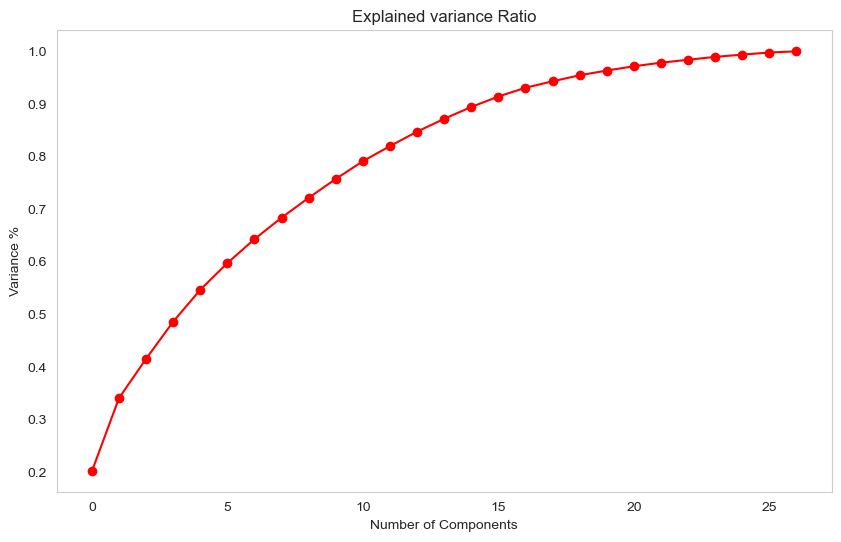

In [56]:
from sklearn.decomposition import PCA
pca = PCA()
#plot the graph to find the principal components
x = pca.fit_transform(X)
plt.figure(figsize=(10,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.xlabel('Number of Components')
plt.ylabel('Variance %')
plt.title('Explained variance Ratio')
plt.grid()

here we see the most distribution variance in 20 feature so we can apply only 20 feature rest can drop the feature.

In [57]:
max_x = PCA(n_components=20)
x = max_x.fit_transform(x)

In [58]:
max_t=pd.DataFrame(x,columns=np.arange(20))

#### Checked VIF after PCA

In [59]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif= pd.DataFrame()
vif['VIF']= [variance_inflation_factor(max_t.values,i) for i in range(max_t.shape[1])]
vif['Features']= max_t.columns
vif

,VIF,Features
0,1.0,0
1,1.0,1
2,1.0,2
3,1.0,3
4,1.0,4
5,1.0,5
6,1.0,6
7,1.0,7
8,1.0,8
9,1.0,9


We can observe the Multicollinearity issue has cleared.

##### Model Building

In [60]:
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor,RandomForestRegressor,BaggingRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

###### find the best random state

In [136]:
#  finding the best Random State for Linear Regression
max_cost_accuracy=0
random_state_max=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(max_t,Y,test_size=0.25,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    pred_accuracy=r2_score(y_test,pred)
    if(max_cost_accuracy<pred_accuracy):
        max_cost_accuracy=pred_accuracy
        random_state_max=i

print(f"Maximum r2 score is {max_cost_accuracy} on Random_state {random_state_max} ")

Maximum r2 score is 0.788434159209431 on Random_state 43 


In [138]:
#  finding the best Random State for RandomForest Regressor
max_cost_accuracy=0
random_state_max=0
for i in range(40,80):
    x_train,x_test,y_train,y_test=train_test_split(max_t,Y,test_size=0.25,random_state=i)
    rfr=RandomForestRegressor()
    rfr.fit(x_train,y_train)
    pred=rfr.predict(x_test)
    pred_accuracy=r2_score(y_test,pred)
    if(max_cost_accuracy<pred_accuracy):
        max_cost_accuracy=pred_accuracy
        random_state_max=i

print(f"Maximum r2 score is {max_cost_accuracy} on Random_state {random_state_max} ")

Maximum r2 score is 0.8549601585271083 on Random_state 47 


here we observe that best accuracy with RandomForestRegressor on 47 random state.

In [61]:
x_train,x_test,y_train,y_test=train_test_split(max_t,Y,test_size=0.25,random_state=47)

In [140]:
# Accuracy check with RandomForest Regressor
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)
pred_rfr=rfr.predict(x_test)
pred_train=rfr.predict(x_train)
print(rfr)
print('R2_score',r2_score(y_test,pred_rfr))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_rfr))
print("Mean Squared error: ",mean_squared_error(y_test,pred_rfr))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_rfr)))

RandomForestRegressor()
R2_score 0.8552746298506682
R2_score on training Data: 97.66186268285357
Mean Absolute Error : 0.8700201780415427
Mean Squared error:  1.243062257566765
Root Mean Squared Error: 1.1149270189419418


In [141]:
# Accuracy check with KNN
knn=KNN()
knn.fit(x_train,y_train)
pred_knn=knn.predict(x_test)
pred_train=knn.predict(x_train)
print(knn)
print('R2_score',r2_score(y_test,pred_knn))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_knn))
print("Mean Squared error: ",mean_squared_error(y_test,pred_knn))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_knn)))

KNeighborsRegressor()
R2_score 0.8625307640193753
R2_score on training Data: 89.37019927682182
Mean Absolute Error : 0.8401543026706231
Mean Squared error:  1.1807385163204747
Root Mean Squared Error: 1.0866179256392168


In [142]:
# Accuracy check with SVR
svr=SVR()
svr.fit(x_train,y_train)
pred_svr=svr.predict(x_test)
pred_train=svr.predict(x_train)
print(svr)
print('R2_score',r2_score(y_test,pred_svr))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_svr))
print("Mean Squared error: ",mean_squared_error(y_test,pred_svr))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_svr)))

SVR()
R2_score 0.869315604451339
R2_score on training Data: 88.408292256288
Mean Absolute Error : 0.7892841459809358
Mean Squared error:  1.1224627692563307
Root Mean Squared Error: 1.0594634346008978


In [143]:
# Accuracy check with GradientBoosting Regressor
gbr=GradientBoostingRegressor()
gbr.fit(x_train,y_train)
pred_gbr=gbr.predict(x_test)
pred_train=gbr.predict(x_train)
print(gbr)
print('R2_score',r2_score(y_test,pred_gbr))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_gbr))
print("Mean Squared error: ",mean_squared_error(y_test,pred_gbr))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_gbr)))

GradientBoostingRegressor()
R2_score 0.8038712240504791
R2_score on training Data: 83.95714012464927
Mean Absolute Error : 1.0211502102206558
Mean Squared error:  1.6845718117981496
Root Mean Squared Error: 1.2979105561625384


In [144]:
# Accuracy check with Lasso
ls=Lasso()
ls.fit(x_train,y_train)
pred_ls=ls.predict(x_test)
pred_train=ls.predict(x_train)
print(ls)
print('R2_score',r2_score(y_test,pred_ls))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_ls))
print("Mean Squared error: ",mean_squared_error(y_test,pred_ls))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_ls)))

Lasso()
R2_score 0.6237448777240095
R2_score on training Data: 60.56548407892255
Mean Absolute Error : 1.4129791946266246
Mean Squared error:  3.2316969805284086
Root Mean Squared Error: 1.7976921261796772


In [145]:
# Accuracy check with Ridge
rg=Ridge()
rg.fit(x_train,y_train)
pred_rg=rg.predict(x_test)
pred_train=rg.predict(x_train)
print(rg)
print('R2_score',r2_score(y_test,pred_rg))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_rg))
print("Mean Squared error: ",mean_squared_error(y_test,pred_rg))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_rg)))

Ridge()
R2_score 0.7780011609760127
R2_score on training Data: 76.19122961923304
Mean Absolute Error : 1.0663484003800452
Mean Squared error:  1.906772653126516
Root Mean Squared Error: 1.3808593893393042


In [146]:
# Accuracy check with DecisionTreeRegressor
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
pred_dtr=dtr.predict(x_test)
pred_train=dtr.predict(x_train)
print(dtr)
print('R2_score',r2_score(y_test,pred_dtr))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_dtr))
print("Mean Squared error: ",mean_squared_error(y_test,pred_dtr))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_dtr)))

DecisionTreeRegressor()
R2_score 0.6343254826604825
R2_score on training Data: 100.0
Mean Absolute Error : 1.300652818991098
Mean Squared error:  3.1408189910979227
Root Mean Squared Error: 1.7722355913077479


In [147]:
# Accuracy check with DecisionTreeRegressor
xgb=XGBRegressor()
xgb.fit(x_train,y_train)
pred_xgb=xgb.predict(x_test)
pred_train=xgb.predict(x_train)
print(xgb)
print('R2_score',r2_score(y_test,pred_xgb))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_xgb))
print("Mean Squared error: ",mean_squared_error(y_test,pred_xgb))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_xgb)))

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)
R2_score 0.8622356074301563
R2_score on training Data: 98.9606775123359
Mean Absolute Error : 0.8416034401913425
Mean Squared error:  1.1832736490048954
Root Mean Squared Error: 1.0877838245740261


##### Cross Validation score check for above model

In [149]:
# Cross validation with Random Forest Regressor
from sklearn.model_selection import cross_val_score
score=cross_val_score(rfr,max_t,Y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_rfr)-score.mean())*100)

[0.68944051 0.55615457 0.57787319 0.68962355 0.54620724]
0.6118598136046334
Difference between R2 score and cross validation score is : 24.341481624603478


In [151]:
# Cross validation with SVR
score=cross_val_score(svr,max_t,Y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_svr)-score.mean())*100)

[0.73038602 0.55676708 0.68577342 0.79004014 0.58086177]
0.6687656861570703
Difference between R2 score and cross validation score is : 20.05499182942687


In [152]:
#  Cross validation with KNN
score=cross_val_score(knn,max_t,Y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_knn)-score.mean())*100)

[0.55774281 0.39882931 0.51629832 0.6254698  0.50618466]
0.5209049803795417
Difference between R2 score and cross validation score is : 34.162578363983364


In [153]:
# Cross validation with GradientBoosting Regressor
score=cross_val_score(gbr,max_t,Y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_gbr)-score.mean())*100)

[0.7273418  0.61134781 0.60556148 0.73130747 0.57348747]
0.6498092060500594
Difference between R2 score and cross validation score is : 15.406201800041963


In [154]:
# Cross validation with Lasso
score=cross_val_score(ls,max_t,Y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_ls)-score.mean())*100)

[0.70581665 0.50215703 0.55598927 0.51807546 0.54033113]
0.5644739075812465
Difference between R2 score and cross validation score is : 5.927097014276306


In [155]:
# Cross validation with Ridge
score=cross_val_score(rg,max_t,Y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_rg)-score.mean())*100)

[0.72158585 0.65332471 0.6564837  0.76707977 0.56484051]
0.6726629058639657
Difference between R2 score and cross validation score is : 10.533825511204697


In [156]:
# Cross validation with Decision Tree Regressor
score=cross_val_score(dtr,max_t,Y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_dtr)-score.mean())*100)

[0.29577319 0.3309046  0.2005023  0.42021913 0.22325985]
0.2941318119210249
Difference between R2 score and cross validation score is : 34.01936707394576


In [157]:
# Cross validation with XGBRegressor
score=cross_val_score(xgb,max_t,Y,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_xgb)-score.mean())*100)

[0.6160644  0.55730295 0.52017292 0.73260256 0.55069701]
0.5953679662343796
Difference between R2 score and cross validation score is : 26.686764119577667


In [160]:
from sklearn.ensemble import BaggingRegressor
br = BaggingRegressor(estimator=None, n_estimators=30, max_samples=0.9, max_features=1.0, bootstrap=True, 
                      bootstrap_features=True, oob_score=True, warm_start=False, n_jobs=1, random_state=47, verbose=5)
br.fit(x_train, y_train)
y_pred_br = br.predict(x_test)
print('Accuracy : ',r2_score(y_test,y_pred_br))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Building estimator 1 of 30 for this parallel run (total 30)...
Building estimator 2 of 30 for this parallel run (total 30)...
Building estimator 3 of 30 for this parallel run (total 30)...
Building estimator 4 of 30 for this parallel run (total 30)...
Building estimator 5 of 30 for this parallel run (total 30)...
Building estimator 6 of 30 for this parallel run (total 30)...
Building estimator 7 of 30 for this parallel run (total 30)...
Building estimator 8 of 30 for this parallel run (total 30)...
Building estimator 9 of 30 for this parallel run (total 30)...
Building estimator 10 of 30 for this parallel run (total 30)...
Building estimator 11 of 30 for this parallel run (total 30)...
Building estimator 12 of 30 for this parallel run (total 30)...
Building estimator 13 of 30 for this parallel run (total 30)...
Building estimator 14 of 30 for this parallel run (total 30)...
Building estimator 15 of 30 for this parallel run (total 30)...
Building estimator 16 of 30 for this parallel run

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


In [161]:
from math import sqrt
import lightgbm as lgb
from sklearn.metrics import mean_squared_log_error
train_data = lgb.Dataset(x_train, label=y_train)
test_data = lgb.Dataset(x_test, label=y_test)

param = {'objective': 'regression',
         'boosting': 'gbdt',  
         'metric': 'l2_root',
         'learning_rate': 0.05, 
         'num_iterations': 350,
         'num_leaves': 31,
         'max_depth': -1,
         'min_data_in_leaf': 15,
         'bagging_fraction': 0.85,
         'bagging_freq': 1,
         'feature_fraction': 0.55
         }

lgbm = lgb.train(params=param,
                 train_set=train_data,
                 valid_sets=[test_data])

y_pred_lgbm = lgbm.predict(x_test)
print('accuracy : ',r2_score(y_test,y_pred_lgbm))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000986 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5100
[LightGBM] [Info] Number of data points in the train set: 5054, number of used features: 20
[LightGBM] [Info] Start training from score 30.550000
accuracy :  0.8774182893049103


Among all Model Support vector regressor(SVR) gave us maximum R2 score of 0.86 and minimum RMSE value of 1.05. So We will perform Hyper Parameter Tuning on SVR.

### Hyper Parameter Tuning : GridSearchCV

In [65]:
# Support Vector Regressor
from sklearn.model_selection import GridSearchCV
parameters = {'kernel':['linear','poly','rbf'],'degree': [-1,-3,1,2,3,5,-2],
             'gamma':['scale','auto'],'coef0':[0.0,0.1,0.2,0.3],
            'C':[0.0,1.0,1.1,0.1],
             'max_iter':[-1,-2,0,1,2]}

In [66]:
gcv=GridSearchCV(SVR(),parameters,cv=5,verbose=3)
gcv.fit(x_train,y_train)

Fitting 5 folds for each of 3360 candidates, totalling 16800 fits
[CV 1/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0,

[CV 2/5] END C=0.0, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=

[CV 4/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0,

[CV 4/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV

[CV 1/5] END C=0.0, coef0=0.0, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, d

[CV 2/5] END C=0.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] E

[CV 3/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0,

[CV 3/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=0;, score=nan total time= 

[CV 4/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=

[CV 3/5] END C=0.0, coef0=0.0, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0

[CV 5/5] END C=0.0, coef0=0.1, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   

[CV 4/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=

[CV 2/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] E

[CV 3/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.

[CV 2/5] END C=0.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[

[CV 5/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, 

[CV 4/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END

[CV 2/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.

[CV 2/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=

[CV 5/5] END C=0.0, coef0=0.1, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-2, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-2, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-2, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0,

[CV 4/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=  

[CV 4/5] END C=0.0, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] E

[CV 5/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0

[CV 1/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coe

[CV 2/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.

[CV 4/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5]

[CV 3/5] END C=0.0, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, deg

[CV 4/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END

[CV 1/5] END C=0.0, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] E

[CV 5/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time

[CV 1/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0,

[CV 5/5] END C=0.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   

[CV 3/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0,

[CV 5/5] END C=0.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.

[CV 2/5] END C=0.0, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0,

[CV 1/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0,

[CV 2/5] END C=0.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree

[CV 1/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C

[CV 2/5] END C=0.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=

[CV 2/5] END C=1.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=

[CV 1/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0,

[CV 2/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[

[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=2;, score=-0.079 total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=2;, score=-0.134 total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.753 total time=   2.6s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.738 total time=   2.7s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.765 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.782 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.747 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=

[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.753 total time=   1.2s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.738 total time=   0.9s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.764 total time=   0.9s
[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.499 total time=   0.8s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.518 total time=   0.8s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.477 total time=   1.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.525 total time=   1.2s
[CV 5/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.500 total time=   0.9s
[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.508 total time=   1.1s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.523 total time=   1.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.483 total time=   1.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.531 total time=   1.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.508 total time=   1.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.831 total time=   1.1s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.809 total time=   1.1s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.835 total time=   1.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.823 total time=   1.1s
[CV 5/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.822 total time=   1.1s
[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.849 total time=   1.5s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.820 total time=   1.4s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.849 total time=   1.7s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.840 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.837 total time=   1.5s
[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.749 total time=   1.3s
[CV 2/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.678 total time=   1.2s
[CV 3/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.771 total time=   1.3s
[CV 4/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.755 total time=   1.4s
[CV 5/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.753 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.748 total time=   2.1s
[CV 2/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.649 total time=   1.7s
[CV 3/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.790 total time=   1.8s
[CV 4/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.777 total time=   2.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.775 total time=   1.7s
[CV 1/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 2/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/

[CV 2/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[

[CV 4/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.

[CV 1/5] END C=1.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.4s
[CV 2/5] END C=1.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.835 total time=   1.4s
[CV 3/5] END C=1.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.853 total time=   1.2s
[CV 4/5] END C=1.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.846 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.845 total time=   1.2s
[CV 1/5] END C=1.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.858 total time=   1.4s
[CV 2/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.842 total time=   1.3s
[CV 3/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.859 total time=   1.4s
[CV 4/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.2s
[CV 5/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.852 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0

[CV 1/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.2s
[CV 2/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.835 total time=   1.4s
[CV 3/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.853 total time=   1.3s
[CV 4/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.846 total time=   1.4s
[CV 5/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.845 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.858 total time=   1.3s
[CV 2/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.842 total time=   1.2s
[CV 3/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.859 total time=   1.3s
[CV 4/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.852 total time=   1.4s
[CV 1/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0

[CV 1/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.2s
[CV 2/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.835 total time=   1.2s
[CV 3/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.853 total time=   1.3s
[CV 4/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.846 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.845 total time=   1.2s
[CV 1/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.858 total time=   1.5s
[CV 2/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.842 total time=   1.7s
[CV 3/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.859 total time=   1.3s
[CV 4/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.2s
[CV 5/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.852 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0

[CV 1/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.5s
[CV 2/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.835 total time=   1.4s
[CV 3/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.853 total time=   1.4s
[CV 4/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.846 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.845 total time=   1.4s
[CV 1/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.858 total time=   1.3s
[CV 2/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.842 total time=   1.3s
[CV 3/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.859 total time=   1.2s
[CV 4/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.852 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0

[CV 1/5] END C=1.0, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[

[CV 4/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5]

[CV 3/5] END C=1.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] EN

[CV 3/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.765 total time=   0.9s
[CV 4/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=-0.051 total time=   0.0s
[C

[CV 2/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.738 total time=   0.9s
[CV 3/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.764 total time=   0.8s
[CV 4/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.782 total time=   1.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.747 total time=   1.1s
[CV 1/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] EN

[CV 1/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.813 total time=   1.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.805 total time=   1.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.824 total time=   0.9s
[CV 4/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.824 total time=   0.9s
[CV 5/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.817 total time=   0.9s
[CV 1/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.818 total time=   1.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.807 total time=   0.9s
[CV 3/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.825 total time=   1.1s
[CV 4/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.825 total time=   1.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.821 total time=   1.1s
[CV 1/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.874 total time=   1.2s
[CV 2/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.857 total time=   1.1s
[CV 3/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.873 total time=   1.4s
[CV 4/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.867 total time=   1.2s
[CV 5/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.863 total time=   1.2s
[CV 1/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.885 total time=   1.9s
[CV 2/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.870 total time=   1.7s
[CV 3/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.880 total time=   2.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.875 total time=   1.9s
[CV 5/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.872 total time=   1.8s
[CV 1/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.869 total time=   1.6s
[CV 2/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.857 total time=   1.6s
[CV 3/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.862 total time=   1.5s
[CV 4/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.869 total time=   1.7s
[CV 5/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.853 total time=   1.6s
[CV 1/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.864 total time=   2.6s
[CV 2/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.864 total time=   2.5s
[CV 3/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.850 total time=   2.5s
[CV 4/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.862 total time=   2.5s
[CV 5/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.855 total time=   2.7s
[CV 1/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 5/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] 

[CV 1/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0,

[CV 1/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coe

[CV 5/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.845 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=-0.051 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=-0.046 total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=-0.056 total time=   0.0s
[CV 4/5] EN

[CV 4/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.852 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=0;, score=-0.051 total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=0;, score=-0.046 total time=   0.0s
[CV 3/5] END C=1.0, 

[CV 3/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.853 total time=   1.2s
[CV 4/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.846 total time=   1.1s
[CV 5/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.845 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=-0.051 total time=   0.0s
[CV 2/5] EN

[CV 2/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.842 total time=   1.4s
[CV 3/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.859 total time=   1.2s
[CV 4/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.852 total time=   1.2s
[CV 1/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, 

[CV 1/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.2s
[CV 2/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.835 total time=   1.2s
[CV 3/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.853 total time=   1.2s
[CV 4/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.846 total time=   1.2s
[CV 5/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.845 total time=   1.5s
[CV 1/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.858 total time=   1.3s
[CV 2/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.842 total time=   1.2s
[CV 3/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.859 total time=   1.2s
[CV 4/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.2s
[CV 5/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.852 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0

[CV 1/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.3s
[CV 2/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.835 total time=   1.1s
[CV 3/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.853 total time=   1.3s
[CV 4/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.846 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.845 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.858 total time=   1.3s
[CV 2/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.842 total time=   1.3s
[CV 3/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.859 total time=   1.2s
[CV 4/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.850 total time=   1.3s
[CV 5/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.852 total time=   1.3s
[CV 1/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0

[CV 1/5] END C=1.0, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5

[CV 2/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=

[CV 5/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END 

[CV 5/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.747 total time=   0.8s
[CV 1/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=-0.051 total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=-0.046 total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=-0.056 total time=   0.0s
[C

[CV 4/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=0;, score=-0.051 total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=0;, score=-0.046 total time=   0.0s
[CV 3/5] EN

[CV 3/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.478 total time=   0.9s
[CV 4/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.525 total time=   0.9s
[CV 5/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.502 total time=   0.9s
[CV 1/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=0;, score=-0.051 total time=   0.0s
[C

[CV 2/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.524 total time=   0.9s
[CV 3/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.484 total time=   1.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.532 total time=   1.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.508 total time=   0.9s
[CV 1/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] EN

[CV 1/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.834 total time=   1.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.812 total time=   1.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.838 total time=   1.1s
[CV 4/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.825 total time=   1.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.824 total time=   1.1s
[CV 1/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.851 total time=   1.4s
[CV 2/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.819 total time=   1.5s
[CV 3/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.850 total time=   1.5s
[CV 4/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.841 total time=   1.6s
[CV 5/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.838 total time=   1.8s
[CV 1/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.753 total time=   1.2s
[CV 2/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.678 total time=   1.2s
[CV 3/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.775 total time=   1.3s
[CV 4/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.758 total time=   1.3s
[CV 5/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.757 total time=   1.2s
[CV 1/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.746 total time=   2.1s
[CV 2/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.643 total time=   2.2s
[CV 3/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.788 total time=   2.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.777 total time=   1.9s
[CV 5/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.775 total time=   1.9s
[CV 1/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1,

[CV 2/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/

[CV 4/5] END C=1.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s

[CV 1/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.753 total time=   0.8s
[CV 2/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.738 total time=   0.8s
[CV 3/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.765 total time=   0.8s
[CV 4/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.782 total time=   0.8s
[CV 5/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.753 total time=   0.9s
[CV 2/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.738 total time=   0.8s
[CV 3/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.764 total time=   0.8s
[CV 4/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.747 total time=   0.8s
[CV 1/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.815 total time=   0.9s
[CV 2/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.806 total time=   0.9s
[CV 3/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.822 total time=   0.8s
[CV 4/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.824 total time=   0.9s
[CV 5/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.816 total time=   1.1s
[CV 1/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.819 total time=   1.2s
[CV 2/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.808 total time=   1.2s
[CV 3/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.824 total time=   1.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.824 total time=   1.1s
[CV 5/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.820 total time=   1.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.867 total time=   1.1s
[CV 2/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.850 total time=   1.1s
[CV 3/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.866 total time=   1.2s
[CV 4/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.861 total time=   1.3s
[CV 5/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.854 total time=   1.4s
[CV 1/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.879 total time=   1.6s
[CV 2/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.861 total time=   1.7s
[CV 3/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.873 total time=   1.8s
[CV 4/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.872 total time=   1.7s
[CV 5/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.864 total time=   1.7s
[CV 1/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.838 total time=   1.6s
[CV 2/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.825 total time=   1.4s
[CV 3/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.834 total time=   1.4s
[CV 4/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.835 total time=   1.4s
[CV 5/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.824 total time=   1.4s
[CV 1/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.840 total time=   2.1s
[CV 2/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.824 total time=   2.1s
[CV 3/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.828 total time=   2.1s
[CV 4/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.839 total time=   2.4s
[CV 5/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.832 total time=   2.2s
[CV 1/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 4/5] END C=1.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV

[CV 3/5] END C=1.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time= 

[CV 3/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1

[CV 1/5] END C=1.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   2.1s
[CV 2/5] END C=1.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   2.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   2.1s
[CV 4/5] END C=1.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   2.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   2.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   2.3s
[CV 2/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   2.1s
[CV 3/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   2.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   2.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   2.2s
[CV 1/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   2.2s
[CV 2/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   2.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   2.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   2.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   2.1s
[CV 1/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   2.1s
[CV 2/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   1.9s
[CV 3/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   2.1s
[CV 4/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   2.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   2.2s
[CV 1/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   2.1s
[CV 2/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   2.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   2.1s
[CV 4/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   2.1s
[CV 5/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   2.2s
[CV 1/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   2.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   1.9s
[CV 3/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   2.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   2.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   2.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   2.2s
[CV 2/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   2.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   2.3s
[CV 4/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   2.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   2.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   2.2s
[CV 2/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   2.3s
[CV 3/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   1.9s
[CV 4/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   2.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   2.2s
[CV 1/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 5/5] END C=1.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[

[CV 2/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1,

[CV 5/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] E

[CV 1/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   2.2s
[CV 2/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   2.1s
[CV 3/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   2.2s
[CV 4/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   2.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   2.2s
[CV 1/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   2.1s
[CV 2/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   2.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   1.9s
[CV 4/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   2.1s
[CV 5/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   2.3s
[CV 1/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   2.1s
[CV 2/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   2.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   2.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   2.1s
[CV 5/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   2.1s
[CV 1/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   2.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   2.1s
[CV 3/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   2.1s
[CV 4/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   2.1s
[CV 5/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   2.1s
[CV 1/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   2.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   1.9s
[CV 3/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   2.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   2.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   2.2s
[CV 1/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   2.1s
[CV 2/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   2.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   2.1s
[CV 4/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   2.1s
[CV 5/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   2.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   2.1s
[CV 2/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   2.1s
[CV 3/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   2.1s
[CV 4/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   2.3s
[CV 5/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   1.9s
[CV 1/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   2.2s
[CV 2/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   2.1s
[CV 3/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   2.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   2.2s
[CV 5/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   1.9s
[CV 1/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 2/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/

[CV 4/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.

[CV 3/5] END C=0.1, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] E

[CV 5/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   1.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total

[CV 1/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   0.8s
[CV 5/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   0.8s
[CV 2/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   0.8s
[CV 3/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   0.8s
[CV 3/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   0.8s
[CV 5/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   0.8s
[CV 3/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   1.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   0.8s
[CV 1/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   0.8s
[CV 2/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   1.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   1.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   0.8s
[CV 2/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   0.8s
[CV 3/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 5/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] 

[CV 4/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[

[CV 2/5] END C=0.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/

[CV 1/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.753 total time=   0.7s
[CV 2/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.740 total time=   0.7s
[CV 3/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.764 total time=   0.8s
[CV 4/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.780 total time=   0.7s
[CV 5/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.744 total time=   0.7s
[CV 1/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.754 total time=   0.8s
[CV 2/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.740 total time=   0.7s
[CV 3/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.764 total time=   0.7s
[CV 4/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.781 total time=   0.8s
[CV 5/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.745 total time=   0.8s
[CV 1/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.778 total time=   0.8s
[CV 2/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.769 total time=   0.7s
[CV 3/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.779 total time=   0.7s
[CV 4/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.797 total time=   0.8s
[CV 5/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.765 total time=   0.7s
[CV 1/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.791 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.780 total time=   0.8s
[CV 3/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.791 total time=   0.8s
[CV 4/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.806 total time=   0.8s
[CV 5/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.778 total time=   0.7s
[CV 1/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.767 total time=   0.7s
[CV 2/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.754 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.771 total time=   0.7s
[CV 4/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.783 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.756 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.805 total time=   0.8s
[CV 2/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.788 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.809 total time=   0.8s
[CV 4/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.811 total time=   0.8s
[CV 5/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.796 total time=   0.8s
[CV 1/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.691 total time=   0.8s
[CV 2/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.664 total time=   1.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.689 total time=   0.8s
[CV 4/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.699 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.682 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.773 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.757 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.780 total time=   1.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.780 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.766 total time=   1.1s
[CV 1/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 4/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0

[CV 1/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5

[CV 5/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] 

[CV 1/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   1.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   1.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   1.1s
[CV 4/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   0.8s
[CV 1/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   1.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   0.8s
[CV 4/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.752 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.738 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.764 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.782 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.752 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.738 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.764 total time=   1.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.782 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.747 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5

[CV 4/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[

[CV 1/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1,

[CV 1/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.755 total time=   1.2s
[CV 2/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.748 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.758 total time=   1.1s
[CV 4/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.758 total time=   1.1s
[CV 5/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.743 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.740 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.737 total time=   1.3s
[CV 3/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.739 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.738 total time=   1.2s
[CV 5/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.728 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1

[CV 1/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.755 total time=   1.2s
[CV 2/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.748 total time=   1.4s
[CV 3/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.758 total time=   1.1s
[CV 4/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.758 total time=   1.2s
[CV 5/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.743 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.740 total time=   1.2s
[CV 2/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.737 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.739 total time=   1.3s
[CV 4/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.738 total time=   1.3s
[CV 5/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.728 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1

[CV 1/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.755 total time=   1.3s
[CV 2/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.748 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.758 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.758 total time=   1.3s
[CV 5/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.743 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.740 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.737 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.739 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.738 total time=   1.2s
[CV 5/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.728 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1

[CV 1/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.755 total time=   1.3s
[CV 2/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.748 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.758 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.758 total time=   1.1s
[CV 5/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.743 total time=   1.1s
[CV 1/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.740 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.737 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.739 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.738 total time=   1.2s
[CV 5/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.728 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1

[CV 4/5] END C=0.1, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5]

GridSearchCV(cv=5, estimator=SVR(),
             param_grid={'C': [0.0, 1.0, 1.1, 0.1],
                         'coef0': [0.0, 0.1, 0.2, 0.3],
                         'degree': [-1, -3, 1, 2, 3, 5, -2],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf'],
                         'max_iter': [-1, -2, 0, 1, 2]},
             verbose=3)

In [67]:
gcv.best_params_

{'C': 1.1,
 'coef0': 0.3,
 'degree': 3,
 'gamma': 'auto',
 'kernel': 'poly',
 'max_iter': -1}

In [70]:
final_model=SVR(C=1.1,coef0=0.3,degree=3,gamma='auto',kernel='poly',max_iter=-1)
final_model.fit(x_train,y_train)
pred=final_model.predict(x_test)
R2_score=r2_score(y_test,pred)
print('R2 Score : ',R2_score*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred))
print("Mean Squared error: ",mean_squared_error(y_test,pred))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred)))

R2 Score :  89.2925387014015
Mean Absolute Error : 0.7189990375928
Mean Squared error:  0.9196757279605468
Root Mean Squared Error: 0.9589972512789319


 True Values Vs Predicted Value plot :


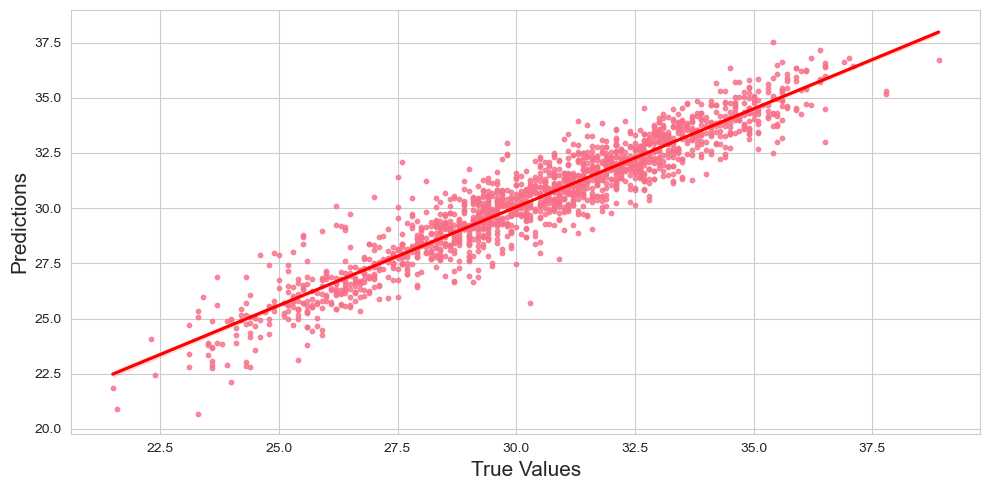

In [72]:
y_pred = final_model.predict(x_test)

y_test = y_test.round(2)

plt.figure(figsize=(10, 5))
sns.regplot(x=y_test, y=y_pred, scatter_kws={"s": 10}, line_kws={"color": "red"})
print('\033[1m' + ' True Values Vs Predicted Value plot :' + '\033[0m')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.tight_layout()
plt.show()

#### Saving the model

In [74]:
import joblib
joblib.dump(final_model,"Next_TMax.pkl")

['Next_TMax.pkl']

In [75]:
# lets load the saved model and get the predictions
model=joblib.load("Next_TMax.pkl")

# prediction
prediction=model.predict(x_test)
prediction

array([31.3075814 , 32.3273645 , 37.51985827, ..., 24.55288598,
       30.58234758, 26.28351938])

In [83]:
# compare with the actual test
a=np.array(y_test)
df_max=pd.DataFrame()
df_max["Predicted"]=prediction
df_max["Original"]=a
df_max

,Predicted,Original
0,31.307581,30.0
1,32.327365,32.1
2,37.519858,35.4
3,30.996365,31.1
4,32.647413,32.5
...,...,...
1680,32.389005,31.9
1681,32.577862,33.0
1682,24.552886,24.1
1683,30.582348,30.5


Conclusion:
In this project, we developed a regression model to predict Next day maximum temprature based on various features. Among the models tested, Support Vector Regressor provided the most accurate predictions. We fine-tuned the hyperparameters, including list key hyperparameters, e.g. ,'C': 1.1,'coef0': 0.3,'degree': 3,'gamma': 'auto','kernel': 'poly','max_iter': -1} to enhance the model's performance.

The final model achieved a mean absolute error (MAE) of 0.71 and demonstrated strong predictive capabilities across different features. The results highlight the effectiveness of machine learning in forecasting next day maximum temprature.

## Machine Learning Model Building For Next_Tmin

##### Separate the feature and label

In [84]:
X_min=df1.drop(['Next_Tmin'],axis=1)
Y_min=df1['Next_Tmin']

In [85]:
print(f'Shape of X data : {X_min.shape}')
print(f'Shape of Y data : {Y_min.shape}')

Shape of X data : (6739, 28)
Shape of Y data : (6739,)


#### Using StandardScalar

In [86]:
from sklearn.preprocessing import StandardScaler
sc_min=StandardScaler()
X_min=pd.DataFrame(sc_min.fit_transform(X_min),columns=X_min.columns)
X_min

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lon,DEM,Slope,Solar radiation,Next_Tmax,Year,Month,Day,State,City
0,-1.672719,-0.425704,-0.814460,0.195915,0.348222,-0.662498,-0.289928,0.176871,0.349992,-0.440130,...,0.002925,1.854393,1.327776,1.891687,-0.489951,-1.421473,-2.806491,1.589342,0.868781,0.790184
1,-1.533959,0.690215,-0.727785,-0.236604,0.261118,-0.016693,0.171379,-0.574617,-0.166810,-0.473686,...,0.518733,0.069704,-0.375858,1.431077,-0.011135,-1.421473,-2.806491,1.589342,0.868781,0.790184
2,-1.395198,0.585598,0.008945,-0.494494,-0.717348,0.070769,0.409475,-0.252083,-1.378337,-0.537958,...,0.845830,-0.353433,-0.944115,1.410511,0.194072,-1.421473,-2.806491,1.589342,0.868781,0.790184
3,-1.256438,0.725088,0.052282,0.194767,1.375094,-0.069787,-0.146681,-0.606795,0.245926,-0.510012,...,0.392926,0.098766,1.249133,1.387059,0.399279,-1.421473,-2.806491,1.589342,0.868781,0.790184
4,-1.117678,0.515853,-0.597774,0.045667,0.186035,-0.284509,-0.074752,-0.541825,1.298111,-0.768323,...,1.814542,-0.278815,-0.392364,1.396254,0.228274,-1.421473,-2.806491,1.589342,-1.025949,-0.893893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6734,1.102482,-2.378563,-2.374595,-2.226900,-1.363447,-0.757521,-2.400625,0.048293,-2.013062,-1.159992,...,0.619378,-0.712912,-0.269357,-1.763704,-1.002969,1.442938,1.002379,1.589342,2.763511,1.351543
6735,1.241243,-2.587798,-2.547943,-1.836710,-0.753410,-1.160213,-2.620034,-0.516916,0.685720,-1.106080,...,1.198089,-0.999559,-1.353609,-1.781247,-0.866164,1.442938,1.002379,1.589342,2.763511,1.351543
6736,1.380003,-2.308818,-2.677955,-2.078766,-1.302260,-1.288468,-2.188536,-0.244791,0.421213,-1.250919,...,-1.255142,-1.576584,-1.278502,-1.779394,-0.763561,1.442938,1.002379,1.589342,2.763511,1.351543
6737,1.518763,-2.308818,-2.417932,-2.273699,-1.457152,-1.049238,-2.207453,0.011101,-0.319269,-1.227700,...,-1.028689,-1.397502,-1.069018,-1.785446,-0.660957,1.442938,1.002379,1.589342,2.763511,1.351543


##### Checking Multicollinearity between features using variance_inflation_factor

In [87]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_min=pd.DataFrame()
vif_min["VIF values"]=[variance_inflation_factor(X_min.values,i) for i in range(len(X_min.columns))]
vif_min["Features"]=X_min.columns
vif_min

,VIF values,Features
0,1.387919,station
1,2.961580,Present_Tmax
2,3.186894,Present_Tmin
3,6.174990,LDAPS_RHmin
4,2.580852,LDAPS_RHmax
5,8.434980,LDAPS_Tmax_lapse
6,6.974675,LDAPS_Tmin_lapse
7,1.236285,LDAPS_WS
8,1.558425,LDAPS_LH
9,4.877436,LDAPS_CC1


here Solar radiation,Month,Day has a highly VIF values so this is highly Multicollinearity.

In [88]:
# drop the Solar radiation column
X_min.drop(['Solar radiation'],axis=1,inplace=True)

##### PCA

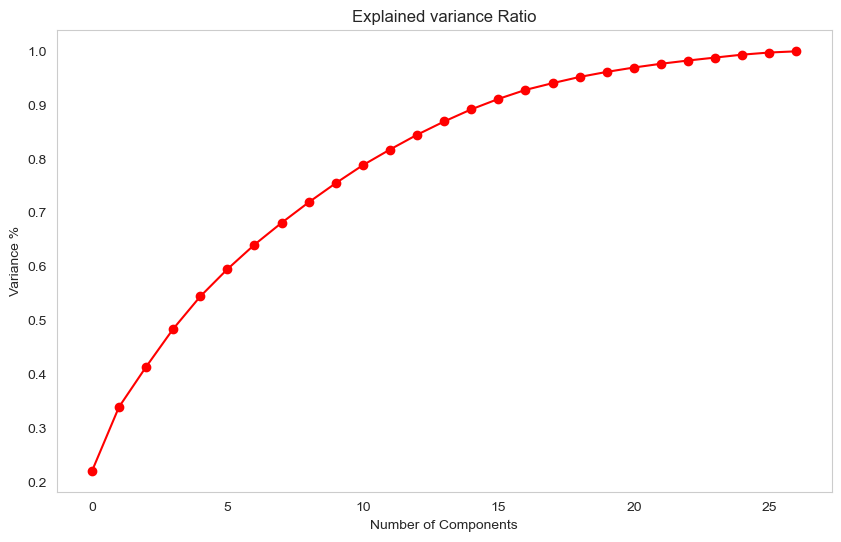

In [89]:
from sklearn.decomposition import PCA
pca_min = PCA()
#plot the graph to find the principal components
x_min = pca_min.fit_transform(X_min)
plt.figure(figsize=(10,6))
plt.plot(np.cumsum(pca_min.explained_variance_ratio_), 'ro-')
plt.xlabel('Number of Components')
plt.ylabel('Variance %')
plt.title('Explained variance Ratio')
plt.grid()

here we see the most distribution variance in 20 feature so we can apply only 20 feature rest can drop the feature.

In [90]:
min_x = PCA(n_components=20)
x_min = min_x.fit_transform(x_min)

In [91]:
min_t=pd.DataFrame(x_min,columns=np.arange(20))

##### Checked VIF after PCA

In [92]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_min= pd.DataFrame()
vif_min['VIF']= [variance_inflation_factor(min_t.values,i) for i in range(min_t.shape[1])]
vif_min['Features']= min_t.columns
vif_min

,VIF,Features
0,1.0,0
1,1.0,1
2,1.0,2
3,1.0,3
4,1.0,4
5,1.0,5
6,1.0,6
7,1.0,7
8,1.0,8
9,1.0,9


### Model Building

##### find the best random state

In [93]:
#  finding the best Random State for Linear Regression
max_cost_accuracy=0
random_state_max=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(min_t,Y_min,test_size=0.25,random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    pred_accuracy=r2_score(y_test,pred)
    if(max_cost_accuracy<pred_accuracy):
        max_cost_accuracy=pred_accuracy
        random_state_max=i

print(f"Maximum r2 score is {max_cost_accuracy} on Random_state {random_state_max} ")

Maximum r2 score is 0.841614016714668 on Random_state 176 


In [94]:
#  finding the best Random State for RandomForest Regressor
max_cost_accuracy=0
random_state_max=0
for i in range(40,80):
    x_train,x_test,y_train,y_test=train_test_split(min_t,Y_min,test_size=0.25,random_state=i)
    rfr=RandomForestRegressor()
    rfr.fit(x_train,y_train)
    pred=rfr.predict(x_test)
    pred_accuracy=r2_score(y_test,pred)
    if(max_cost_accuracy<pred_accuracy):
        max_cost_accuracy=pred_accuracy
        random_state_max=i

print(f"Maximum r2 score is {max_cost_accuracy} on Random_state {random_state_max} ")

Maximum r2 score is 0.8671762397717249 on Random_state 56 


here we observe that best accuracy with RandomForestRegressor on 56 random state.

In [96]:
x_train,x_test,y_train,y_test=train_test_split(min_t,Y_min,test_size=0.25,random_state=56)

In [97]:
# Accuracy check with RandomForest Regressor
rfr=RandomForestRegressor()
rfr.fit(x_train,y_train)
pred_rfr=rfr.predict(x_test)
pred_train=rfr.predict(x_train)
print(rfr)
print('R2_score',r2_score(y_test,pred_rfr))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_rfr))
print("Mean Squared error: ",mean_squared_error(y_test,pred_rfr))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_rfr)))

RandomForestRegressor()
R2_score 0.8686549667404471
R2_score on training Data: 97.86686818654972
Mean Absolute Error : 0.6727287833827897
Mean Squared error:  0.7268838433234425
Root Mean Squared Error: 0.8525748315094942


In [98]:
# Accuracy check with KNN
knn=KNN()
knn.fit(x_train,y_train)
pred_knn=knn.predict(x_test)
pred_train=knn.predict(x_train)
print(knn)
print('R2_score',r2_score(y_test,pred_knn))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_knn))
print("Mean Squared error: ",mean_squared_error(y_test,pred_knn))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_knn)))

KNeighborsRegressor()
R2_score 0.8564913109249761
R2_score on training Data: 90.34580741972592
Mean Absolute Error : 0.700545994065282
Mean Squared error:  0.7941994065281899
Root Mean Squared Error: 0.8911786613963498


In [99]:
# Accuracy check with SVR
svr=SVR()
svr.fit(x_train,y_train)
pred_svr=svr.predict(x_test)
pred_train=svr.predict(x_train)
print(svr)
print('R2_score',r2_score(y_test,pred_svr))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_svr))
print("Mean Squared error: ",mean_squared_error(y_test,pred_svr))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_svr)))

SVR()
R2_score 0.8996012659956575
R2_score on training Data: 92.35327581431521
Mean Absolute Error : 0.5757230706726103
Mean Squared error:  0.5556222098910367
Root Mean Squared Error: 0.7454007042464051


In [100]:
# Accuracy check with GradientBoosting Regressor
gbr=GradientBoostingRegressor()
gbr.fit(x_train,y_train)
pred_gbr=gbr.predict(x_test)
pred_train=gbr.predict(x_train)
print(gbr)
print('R2_score',r2_score(y_test,pred_gbr))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_gbr))
print("Mean Squared error: ",mean_squared_error(y_test,pred_gbr))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_gbr)))

GradientBoostingRegressor()
R2_score 0.854538163075111
R2_score on training Data: 87.91834275354196
Mean Absolute Error : 0.7151529392047207
Mean Squared error:  0.8050084305198577
Root Mean Squared Error: 0.897222620379055


In [101]:
# Accuracy check with Ridge
rg=Ridge()
rg.fit(x_train,y_train)
pred_rg=rg.predict(x_test)
pred_train=rg.predict(x_train)
print(rg)
print('R2_score',r2_score(y_test,pred_rg))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_rg))
print("Mean Squared error: ",mean_squared_error(y_test,pred_rg))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_rg)))

Ridge()
R2_score 0.8339010775717715
R2_score on training Data: 82.6130600086277
Mean Absolute Error : 0.7637956693788043
Mean Squared error:  0.9192172715654012
Root Mean Squared Error: 0.9587581924371761


In [102]:
# Accuracy check with Lasso
ls=Lasso()
ls.fit(x_train,y_train)
pred_ls=ls.predict(x_test)
pred_train=ls.predict(x_train)
print(ls)
print('R2_score',r2_score(y_test,pred_ls))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_ls))
print("Mean Squared error: ",mean_squared_error(y_test,pred_ls))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_ls)))

Lasso()
R2_score 0.6109901322344231
R2_score on training Data: 60.05614454882714
Mean Absolute Error : 1.183473774604024
Mean Squared error:  2.1528411143907555
Root Mean Squared Error: 1.4672563219801629


In [103]:
# Accuracy check with DecisionTreeRegressor
dtr=DecisionTreeRegressor()
dtr.fit(x_train,y_train)
pred_dtr=dtr.predict(x_test)
pred_train=dtr.predict(x_train)
print(dtr)
print('R2_score',r2_score(y_test,pred_dtr))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_dtr))
print("Mean Squared error: ",mean_squared_error(y_test,pred_dtr))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_dtr)))

DecisionTreeRegressor()
R2_score 0.6970805122768629
R2_score on training Data: 100.0
Mean Absolute Error : 0.9871810089020772
Mean Squared error:  1.6764035608308605
Root Mean Squared Error: 1.2947600398648627


In [104]:
# Accuracy check with DecisionTreeRegressor
xgb=XGBRegressor()
xgb.fit(x_train,y_train)
pred_xgb=xgb.predict(x_test)
pred_train=xgb.predict(x_train)
print(xgb)
print('R2_score',r2_score(y_test,pred_xgb))
print('R2_score on training Data:',r2_score(y_train,pred_train)*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_xgb))
print("Mean Squared error: ",mean_squared_error(y_test,pred_xgb))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_xgb)))

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)
R2_score 0.8854077102022475
R2_score on training Data: 99.20665165547618
Mean Absolute Error : 0.6249391638419041
Mean Squared error:  0.6341715553021556
Root Mean Squared Error: 0.7963488904382021


##### Cross Validation score check for above model

In [105]:
# Cross validation with Random Forest Regressor
from sklearn.model_selection import cross_val_score
score=cross_val_score(rfr,min_t,Y_min,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_rfr)-score.mean())*100)

[0.58664913 0.63422115 0.7333224  0.80084668 0.84338303]
0.7196844772939741
Difference between R2 score and cross validation score is : 14.897048944647295


In [106]:
# Cross validation with SVR
score=cross_val_score(svr,min_t,Y_min,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_svr)-score.mean())*100)

[0.59506489 0.6315133  0.76314016 0.83881508 0.79208022]
0.7241227309675439
Difference between R2 score and cross validation score is : 17.54785350281136


In [107]:
#  Cross validation with KNN
score=cross_val_score(knn,min_t,Y_min,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_knn)-score.mean())*100)

[0.40043642 0.44356388 0.60980803 0.71854805 0.75957205]
0.586385686651535
Difference between R2 score and cross validation score is : 27.01056242734411


In [108]:
# Cross validation with GradientBoosting Regressor
score=cross_val_score(gbr,min_t,Y_min,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_gbr)-score.mean())*100)

[0.63775122 0.65394768 0.76457899 0.81579707 0.85388332]
0.7451916543131458
Difference between R2 score and cross validation score is : 10.934650876196518


In [109]:
# Cross validation with Lasso
score=cross_val_score(ls,min_t,Y_min,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_ls)-score.mean())*100)

[0.43709027 0.4264832  0.5554798  0.57065833 0.63653216]
0.5252487512677154
Difference between R2 score and cross validation score is : 8.574138096670769


In [110]:
# Cross validation with Ridge
score=cross_val_score(rg,min_t,Y_min,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_rg)-score.mean())*100)

[0.73672917 0.67008293 0.78529084 0.86799845 0.84904632]
0.7818295429680387
Difference between R2 score and cross validation score is : 5.20715346037327


In [111]:
# Cross validation with Decision Tree Regressor
score=cross_val_score(dtr,min_t,Y_min,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_dtr)-score.mean())*100)

[0.24702787 0.24410954 0.53577832 0.66181718 0.63908526]
0.4655636350427065
Difference between R2 score and cross validation score is : 23.151687723415638


In [112]:
from sklearn.ensemble import BaggingRegressor
br = BaggingRegressor(estimator=None, n_estimators=30, max_samples=0.9, max_features=1.0, bootstrap=True, 
                      bootstrap_features=True, oob_score=True, warm_start=False, n_jobs=1, random_state=42, verbose=5)
br.fit(x_train, y_train)
y_pred_br = br.predict(x_test)
print('Accuracy : ',r2_score(y_test,y_pred_br))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Building estimator 1 of 30 for this parallel run (total 30)...
Building estimator 2 of 30 for this parallel run (total 30)...
Building estimator 3 of 30 for this parallel run (total 30)...
Building estimator 4 of 30 for this parallel run (total 30)...
Building estimator 5 of 30 for this parallel run (total 30)...
Building estimator 6 of 30 for this parallel run (total 30)...
Building estimator 7 of 30 for this parallel run (total 30)...
Building estimator 8 of 30 for this parallel run (total 30)...
Building estimator 9 of 30 for this parallel run (total 30)...
Building estimator 10 of 30 for this parallel run (total 30)...
Building estimator 11 of 30 for this parallel run (total 30)...
Building estimator 12 of 30 for this parallel run (total 30)...
Building estimator 13 of 30 for this parallel run (total 30)...
Building estimator 14 of 30 for this parallel run (total 30)...
Building estimator 15 of 30 for this parallel run (total 30)...
Building estimator 16 of 30 for this parallel run

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


In [113]:
from math import sqrt
import lightgbm as lgb
from sklearn.metrics import mean_squared_log_error
train_data = lgb.Dataset(x_train, label=y_train)
test_data = lgb.Dataset(x_test, label=y_test)

param = {'objective': 'regression',
         'boosting': 'gbdt',  
         'metric': 'l2_root',
         'learning_rate': 0.05, 
         'num_iterations': 350,
         'num_leaves': 31,
         'max_depth': -1,
         'min_data_in_leaf': 15,
         'bagging_fraction': 0.85,
         'bagging_freq': 1,
         'feature_fraction': 0.55
         }

lgbm = lgb.train(params=param,
                 train_set=train_data,
                 valid_sets=[test_data])

y_pred_lgbm = lgbm.predict(x_test)
print('accuracy : ',r2_score(y_test,y_pred_lgbm))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5100
[LightGBM] [Info] Number of data points in the train set: 5054, number of used features: 20
[LightGBM] [Info] Start training from score 23.073130
accuracy :  0.8970448461467467


In [114]:
# Cross validation with XGBoost
score=cross_val_score(xgb,min_t,Y_min,cv=5,scoring='r2')
print(score)
print(score.mean())
print("Difference between R2 score and cross validation score is :",(r2_score(y_test,pred_xgb)-score.mean())*100)

[0.59753987 0.62216881 0.73533325 0.80490817 0.81946253]
0.7158825260786861
Difference between R2 score and cross validation score is : 16.95251841235614


Among all Model SVR gave us maximum R2 score of 0.88 and minimum RMSE value of 0.74. So We will perform Hyper Parameter Tuning on Support Vector Regressor.

### Hyper Parameter Tuning : GridSearchCV

In [116]:
# Support Vector Regressor
parameters = {'kernel':['linear','poly','rbf'],'degree': [-1,-3,1,2,3,5,-2],
             'gamma':['scale','auto'],'coef0':[0.0,0.1,0.2,0.3],
            'C':[0.0,1.0,1.1,0.1],
             'max_iter':[-1,-2,0,1,2]}

In [117]:
gcv_min=GridSearchCV(SVR(),parameters,cv=5,verbose=3)
gcv_min.fit(x_train,y_train)

Fitting 5 folds for each of 3360 candidates, totalling 16800 fits
[CV 1/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0,

[CV 4/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV

[CV 3/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0

[CV 4/5] END C=0.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=

[CV 3/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0,

[CV 3/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5

[CV 4/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=5, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degr

[CV 4/5] END C=0.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.0, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0,

[CV 5/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   

[CV 5/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   

[CV 5/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0,

[CV 1/5] END C=0.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree

[CV 3/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0

[CV 1/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] E

[CV 2/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0,

[CV 1/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.1, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5

[CV 1/5] END C=0.0, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=

[CV 3/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0

[CV 4/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV

[CV 4/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, co

[CV 3/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=2, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0,

[CV 1/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0

[CV 1/5] END C=0.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=

[CV 5/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.

[CV 3/5] END C=0.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0

[CV 1/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5

[CV 5/5] END C=0.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0

[CV 2/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=1, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef

[CV 1/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0,

[CV 4/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END

[CV 3/5] END C=0.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0

[CV 2/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=5, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, de

[CV 4/5] END C=0.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.0, coef0=0.3, degree=-2, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.

[CV 1/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0

[CV 3/5] END C=1.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1

[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.6s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.5s
[CV 5/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.5s
[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.7s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.4s
[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.3s
[CV 1/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.6s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.5s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.8s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.7s
[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.8s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.7s
[CV 1/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.9s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.6s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.5s
[CV 1/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.6s
[CV 2/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.7s
[CV 3/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.8s
[CV 4/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.5s
[CV 5/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.6s
[CV 3/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.5s
[CV 1/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 2/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=

[CV 5/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   

[CV 4/5] END C=1.0, coef0=0.1, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-3, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-3, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-3, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] E

[CV 4/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-3, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=

[CV 1/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.6s
[CV 3/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.6s
[CV 4/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.4s
[CV 5/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.4s
[CV 1/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.5s
[CV 2/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.4s
[CV 3/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.6s
[CV 4/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.3s
[CV 5/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.1s
[CV 1/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.5s
[CV 2/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.5s
[CV 3/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.4s
[CV 4/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.4s
[CV 5/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.2s
[CV 1/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.3s
[CV 2/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.4s
[CV 3/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.3s
[CV 4/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.3s
[CV 5/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.2s
[CV 1/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.3s
[CV 2/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.3s
[CV 3/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.3s
[CV 4/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.5s
[CV 5/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.6s
[CV 2/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.7s
[CV 1/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.8s
[CV 4/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.4s
[CV 1/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 3/5] END C=1.0, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0,

[CV 3/5] END C=1.0, coef0=0.2, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[

[CV 1/5] END C=1.0, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C

[CV 1/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.4s
[CV 2/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.6s
[CV 3/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.7s
[CV 1/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   3.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.4s
[CV 5/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.3s
[CV 1/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.9s
[CV 2/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.7s
[CV 3/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.4s
[CV 5/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.7s
[CV 1/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.9s
[CV 2/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.7s
[CV 1/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.9s
[CV 3/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.6s
[CV 5/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   3.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.6s
[CV 5/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.5s
[CV 1/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.9s
[CV 3/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 4/5] END C=1.0, coef0=0.2, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-2, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-2, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] E

[CV 5/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END 

[CV 3/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0,

[CV 3/5] END C=1.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[

[CV 1/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.9s
[CV 2/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.4s
[CV 3/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.7s
[CV 1/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.5s
[CV 2/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.5s
[CV 5/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   3.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.7s
[CV 3/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.6s
[CV 4/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.9s
[CV 5/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.7s
[CV 1/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.6s
[CV 2/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.6s
[CV 3/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.8s
[CV 4/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.9s
[CV 5/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.6s
[CV 2/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.6s
[CV 3/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.8s
[CV 4/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.6s
[CV 5/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.5s
[CV 2/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.6s
[CV 3/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.5s
[CV 4/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.7s
[CV 3/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.6s
[CV 4/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.6s
[CV 5/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.6s
[CV 1/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.0, coef0=0.3, degree=-2, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.0,

[CV 3/5] END C=1.1, coef0=0.0, degree=-1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-1, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5

[CV 5/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.

[CV 1/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5

[CV 1/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.813 total time=   0.9s
[CV 2/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.816 total time=   1.1s
[CV 3/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.818 total time=   1.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.828 total time=   1.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.833 total time=   1.1s
[CV 1/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.813 total time=   1.3s
[CV 2/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.816 total time=   1.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.818 total time=   1.2s
[CV 4/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.828 total time=   1.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.833 total time=   1.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.529 total time=   1.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.511 total time=   1.1s
[CV 3/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.526 total time=   1.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.501 total time=   1.2s
[CV 5/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.574 total time=   1.1s
[CV 1/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.541 total time=   1.1s
[CV 2/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.529 total time=   1.3s
[CV 3/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.540 total time=   1.2s
[CV 4/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.522 total time=   1.2s
[CV 5/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.585 total time=   1.1s
[CV 1/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.855 total time=   3.7s
[CV 2/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.855 total time=   5.7s
[CV 3/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.867 total time=   4.9s
[CV 4/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.861 total time=   2.9s
[CV 5/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.871 total time=   3.6s
[CV 1/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.866 total time=   2.3s
[CV 2/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.871 total time=   2.2s
[CV 3/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.876 total time=   2.4s
[CV 4/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.874 total time=   2.2s
[CV 5/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.882 total time=   2.1s
[CV 1/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.766 total time=   1.6s
[CV 2/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.775 total time=   1.5s
[CV 3/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.811 total time=   1.5s
[CV 4/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.757 total time=   1.6s
[CV 5/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.790 total time=   1.6s
[CV 1/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.763 total time=   2.4s
[CV 2/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.792 total time=   2.6s
[CV 3/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.826 total time=   2.5s
[CV 4/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.748 total time=   2.5s
[CV 5/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.808 total time=   2.5s
[CV 1/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 2/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.

[CV 1/5] END C=1.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5

[CV 2/5] END C=1.1, coef0=0.1, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-3, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=

[CV 1/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   3.1s
[CV 2/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.2s
[CV 4/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   3.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   3.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   3.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   3.2s
[CV 1/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   3.1s
[CV 3/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.3s
[CV 4/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   3.2s
[CV 5/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   3.1s
[CV 1/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   3.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.9s
[CV 4/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   3.1s
[CV 5/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.1s
[CV 4/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.9s
[CV 5/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.3s
[CV 4/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.9s
[CV 5/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.8s
[CV 4/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.8s
[CV 1/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.7s
[CV 2/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.9s
[CV 3/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   3.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 4/5] END C=1.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END

[CV 2/5] END C=1.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/

[CV 5/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=1;, score=nan total time

[CV 2/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-3, gamma=auto, kernel=rbf, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef

[CV 1/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.7s
[CV 3/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.7s
[CV 4/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.5s
[CV 5/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.5s
[CV 2/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.7s
[CV 3/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.9s
[CV 4/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.6s
[CV 5/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.7s
[CV 1/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.9s
[CV 2/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   3.2s
[CV 3/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.6s
[CV 5/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.8s
[CV 1/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.9s
[CV 3/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.8s
[CV 1/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   3.1s
[CV 2/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.6s
[CV 3/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   3.2s
[CV 1/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   2.8s
[CV 4/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.8s
[CV 1/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.7s
[CV 3/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.8s
[CV 4/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   3.2s
[CV 1/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 2/5] END C=1.1, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.2, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] E

[CV 2/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=

[CV 4/5] END C=1.1, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-1, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1,

[CV 1/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-3, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1,

[CV 1/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.9s
[CV 2/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.5s
[CV 4/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   3.3s
[CV 5/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   3.2s
[CV 1/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.9s
[CV 2/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.3s
[CV 4/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.8s
[CV 3/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.9s
[CV 5/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   3.1s
[CV 1/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.9s
[CV 3/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   3.1s
[CV 5/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   3.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   2.9s
[CV 3/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   3.4s
[CV 5/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   3.5s
[CV 1/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.9s
[CV 2/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   2.9s
[CV 4/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.9s
[CV 5/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   2.6s
[CV 2/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   3.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   3.1s
[CV 4/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   2.8s
[CV 5/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   2.8s
[CV 2/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   2.9s
[CV 3/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   3.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   2.7s
[CV 5/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   2.9s
[CV 1/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 4/5] END C=1.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=1.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=1.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=1.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=1.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5]

[CV 4/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=1.1, coef0=0.3, degree=-2, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time= 

[CV 1/5] END C=0.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=-1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1,

[CV 5/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END 

[CV 5/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.833 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=-0.005 total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=-0.073 total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=1, gamma=scale, kernel=poly, max_iter=0;, score=-0.029 total time=   0.0s
[C

[CV 4/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.827 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.833 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=0;, score=-0.005 total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=1, gamma=auto, kernel=poly, max_iter=0;, score=-0.073 total time=   0.0s
[CV 3/5] EN

[CV 3/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.374 total time=   1.1s
[CV 4/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.315 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.418 total time=   0.8s
[CV 1/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=2, gamma=scale, kernel=poly, max_iter=0;, score=-0.005 total time=   0.0s
[C

[CV 2/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.393 total time=   1.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.425 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.359 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.469 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] EN

[CV 1/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.776 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.758 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.783 total time=   1.1s
[CV 4/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.771 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.789 total time=   1.1s
[CV 1/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.810 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.804 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.822 total time=   1.1s
[CV 4/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.813 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.829 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.617 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.589 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.630 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.605 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.620 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.728 total time=   1.2s
[CV 2/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.724 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.753 total time=   1.4s
[CV 4/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.709 total time=   1.2s
[CV 5/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.740 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 4/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.0, degree=-2, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[

[CV 2/5] END C=0.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] E

[CV 4/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=-3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=-3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time= 

[CV 1/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   1.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   1.1s
[CV 4/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   1.3s
[CV 5/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=1, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   1.3s
[CV 3/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   1.3s
[CV 4/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   1.1s
[CV 5/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   1.1s
[CV 1/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=1, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   1.3s
[CV 2/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   1.4s
[CV 3/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   1.1s
[CV 4/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   1.1s
[CV 5/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   1.1s
[CV 1/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=2, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   1.1s
[CV 5/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   1.1s
[CV 1/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=2, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   1.2s
[CV 2/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   1.2s
[CV 5/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=3, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   1.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   1.1s
[CV 5/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=3, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 1/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.813 total time=   1.3s
[CV 2/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.816 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.818 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.828 total time=   1.2s
[CV 5/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-1;, score=0.834 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=5, gamma=scale, kernel=linear, max_iter=-2;, score=nan t

[CV 1/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.813 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.816 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.818 total time=   1.3s
[CV 4/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.828 total time=   1.1s
[CV 5/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-1;, score=0.834 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=5, gamma=auto, kernel=linear, max_iter=-2;, score=nan total time

[CV 2/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.1, degree=-2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] E

[CV 4/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s

[CV 3/5] END C=0.1, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-1, gamma=auto, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0

[CV 3/5] END C=0.1, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-3, gamma=auto, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0

[CV 1/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.4s
[CV 2/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.804 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.4s
[CV 5/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=-1;, score=0.819 total time=   1.4s
[CV 1/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=1, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.784 total time=   1.4s
[CV 2/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.786 total time=   1.3s
[CV 3/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.785 total time=   1.3s
[CV 4/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.785 total time=   1.5s
[CV 5/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=rbf, max_iter=-1;, score=0.801 total time=   1.5s
[CV 1/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=1, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1

[CV 1/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.2s
[CV 2/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.4s
[CV 3/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.804 total time=   1.3s
[CV 4/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.5s
[CV 5/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=-1;, score=0.819 total time=   1.4s
[CV 1/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=2, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.784 total time=   1.4s
[CV 2/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.786 total time=   1.2s
[CV 3/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.785 total time=   1.5s
[CV 4/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.785 total time=   1.3s
[CV 5/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=rbf, max_iter=-1;, score=0.801 total time=   1.3s
[CV 1/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1

[CV 1/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.3s
[CV 2/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.4s
[CV 3/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.804 total time=   1.5s
[CV 4/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.2s
[CV 5/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=rbf, max_iter=-1;, score=0.819 total time=   1.3s
[CV 1/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=3, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.784 total time=   1.3s
[CV 2/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.786 total time=   1.3s
[CV 3/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.785 total time=   1.2s
[CV 4/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.785 total time=   1.2s
[CV 5/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-1;, score=0.801 total time=   1.3s
[CV 1/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=3, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1

[CV 1/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.3s
[CV 2/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.3s
[CV 3/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.804 total time=   1.4s
[CV 4/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.803 total time=   1.3s
[CV 5/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=rbf, max_iter=-1;, score=0.819 total time=   1.3s
[CV 1/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=5, gamma=scale, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.784 total time=   1.3s
[CV 2/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.786 total time=   1.3s
[CV 3/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.785 total time=   1.5s
[CV 4/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.785 total time=   1.3s
[CV 5/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-1;, score=0.801 total time=   1.5s
[CV 1/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=5, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1

[CV 3/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.2, degree=-2, gamma=auto, kernel=rbf, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1,

[CV 2/5] END C=0.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-1, gamma=scale, kernel=rbf, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-1, gamma=auto, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 

[CV 2/5] END C=0.1, coef0=0.3, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-3, gamma=scale, kernel=linear, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-3, gamma=scale, kernel=linear, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-3, gamma=scale, kernel=linear, max_iter=-2;, score=nan to

[CV 3/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=linear, max_iter=2;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=-1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5

[CV 1/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.812 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.813 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.818 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.826 total time=   0.8s
[CV 5/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=-1;, score=0.833 total time=   0.8s
[CV 1/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=1, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.812 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.814 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.818 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.827 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=poly, max_iter=-1;, score=0.833 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=1, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.848 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.845 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.845 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.850 total time=   0.8s
[CV 5/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=-1;, score=0.863 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=2, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.852 total time=   0.8s
[CV 2/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.850 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.851 total time=   0.8s
[CV 4/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.855 total time=   0.9s
[CV 5/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-1;, score=0.866 total time=   0.9s
[CV 1/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=2, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.863 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.855 total time=   0.9s
[CV 3/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.863 total time=   0.9s
[CV 4/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.861 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-1;, score=0.875 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=3, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.875 total time=   0.9s
[CV 2/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.869 total time=   1.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.878 total time=   1.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.873 total time=   1.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=poly, max_iter=-1;, score=0.886 total time=   1.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=3, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 1/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.858 total time=   1.1s
[CV 2/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.843 total time=   1.1s
[CV 3/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.861 total time=   1.3s
[CV 4/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.842 total time=   1.3s
[CV 5/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=poly, max_iter=-1;, score=0.869 total time=   1.2s
[CV 1/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=5, gamma=scale, kernel=poly, max_iter=-2;, score=nan total time=   0.0s


[CV 1/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.883 total time=   1.2s
[CV 2/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.875 total time=   1.5s
[CV 3/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.889 total time=   1.5s
[CV 4/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.868 total time=   1.5s
[CV 5/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-1;, score=0.892 total time=   1.4s
[CV 1/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=5, gamma=auto, kernel=poly, max_iter=-2;, score=nan total time=   0.0s
[CV 5/5] 

[CV 3/5] END C=0.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=0;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 2/5] END C=0.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 3/5] END C=0.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 4/5] END C=0.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 5/5] END C=0.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=1;, score=nan total time=   0.0s
[CV 1/5] END C=0.1, coef0=0.3, degree=-2, gamma=scale, kernel=poly, max_iter=2;, score=nan total time=   0.0s
[CV 2/5] E

GridSearchCV(cv=5, estimator=SVR(),
             param_grid={'C': [0.0, 1.0, 1.1, 0.1],
                         'coef0': [0.0, 0.1, 0.2, 0.3],
                         'degree': [-1, -3, 1, 2, 3, 5, -2],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'poly', 'rbf'],
                         'max_iter': [-1, -2, 0, 1, 2]},
             verbose=3)

In [118]:
gcv_min.best_params_

{'C': 1.1,
 'coef0': 0.3,
 'degree': 5,
 'gamma': 'scale',
 'kernel': 'poly',
 'max_iter': -1}

In [119]:
final_model_min=SVR(C=1.1,coef0=0.3,degree=5,gamma='scale',kernel='poly',max_iter=-1)
final_model_min.fit(x_train,y_train)
pred_min=final_model_min.predict(x_test)
R2_score=r2_score(y_test,pred_min)
print('R2 Score : ',R2_score*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,pred_min))
print("Mean Squared error: ",mean_squared_error(y_test,pred_min))
print("Root Mean Squared Error:",np.sqrt(mean_squared_error(y_test,pred_min)))

R2 Score :  91.86063887103762
Mean Absolute Error : 0.5077273531029319
Mean Squared error:  0.45044490475145543
Root Mean Squared Error: 0.6711519237486065


 True Values Vs Predicted Value plot :


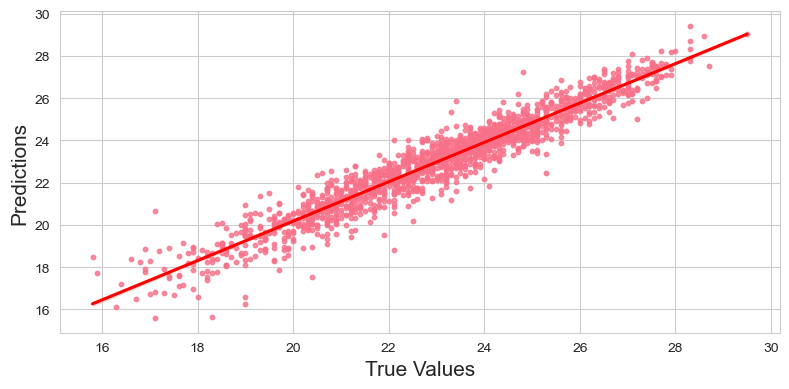

In [121]:
y_pred_min = final_model_min.predict(x_test)

y_test_min = y_test.round(2)

plt.figure(figsize=(8, 4))
sns.regplot(x=y_test_min, y=y_pred_min, scatter_kws={"s": 10}, line_kws={"color": "red"})
print('\033[1m' + ' True Values Vs Predicted Value plot :' + '\033[0m')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.tight_layout()
plt.show()

#### Saving the model

In [122]:
import joblib
joblib.dump(final_model_min,"Next_Tmin.pkl")

['Next_Tmin.pkl']

In [123]:
# lets load the saved model and get the predictions
model_min=joblib.load("Next_Tmin.pkl")

# prediction
prediction_min=model_min.predict(x_test)
prediction_min

array([24.04919194, 23.04718273, 22.44513094, ..., 21.52280194,
       23.35022575, 19.82653216])

In [124]:
# compare with the actual test
a_min=np.array(y_test)
df_min=pd.DataFrame()
df_min["Predicted"]=prediction_min
df_min["Original"]=a_min
df_min

,Predicted,Original
0,24.049192,23.9
1,23.047183,22.5
2,22.445131,21.7
3,20.254406,20.3
4,25.140409,24.6
...,...,...
1680,23.857144,24.3
1681,18.891022,19.9
1682,21.522802,20.7
1683,23.350226,23.9


Conclusion:
In this project, we developed a regression model to predict Next day minimum temprature based on various features. Among the models tested, Support Vector Regressor provided the most accurate predictions. We fine-tuned the hyperparameters, including list key hyperparameters, e.g. ,'C': 1.1,'coef0': 0.3, 'degree': 5, 'gamma': 'scale', 'kernel': 'poly', 'max_iter': -1} to enhance the model's performance.

The final model achieved a mean absolute error (MAE) of 0.50 and demonstrated strong predictive capabilities across different features. The results highlight the effectiveness of machine learning in forecasting next day minimum temprature.